In [1]:
import os
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split
import torchvision.models as models
import torch.nn as nn
import torch
from torchsummary import summary
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from tqdm import tqdm
import os
import numpy as np
import matplotlib.pyplot as plt
import torchvision
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import scipy.io
import torch.optim as optim
# check if CUDA is available
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CUDA is available!  Training on GPU ...


In [2]:
import random
def seed_all(seed=1029):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # if you are using multi-GPU.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
seed_all(1029)

In [3]:
# Map class names to indices
class_names = [
    'pink primrose', 'hard-leaved pocket orchid', 'canterbury bells', 'sweet pea',
    'english marigold', 'tiger lily', 'moon orchid', 'bird of paradise', 'monkshood',
    'globe thistle', 'snapdragon', "colt's foot", 'king protea', 'spear thistle',
    'yellow iris', 'globe-flower', 'purple coneflower', 'peruvian lily', 'balloon flower',
    'giant white arum lily', 'fire lily', 'pincushion flower', 'fritillary',
    'red ginger', 'grape hyacinth', 'corn poppy', 'prince of wales feathers',
    'stemless gentian', 'artichoke', 'sweet william', 'carnation', 'garden phlox',
    'love in the mist', 'mexican aster', 'alpine sea holly', 'ruby-lipped cattleya',
    'cape flower', 'great masterwort', 'siam tulip', 'lenten rose', 'barbeton daisy',
    'daffodil', 'sword lily', 'poinsettia', 'bolero deep blue', 'wallflower',
    'marigold', 'buttercup', 'oxeye daisy', 'common dandelion', 'petunia',
    'wild pansy', 'primula', 'sunflower', 'pelargonium', 'bishop of llandaff',
    'gaura', 'geranium', 'orange dahlia', 'pink-yellow dahlia?', 'cautleya spicata',
    'japanese anemone', 'black-eyed susan', 'silverbush', 'californian poppy',
    'osteospermum', 'spring crocus', 'bearded iris', 'windflower', 'tree poppy',
    'gazania', 'azalea', 'water lily', 'rose', 'thorn apple', 'morning glory',
    'passion flower', 'lotus', 'toad lily', 'anthurium', 'frangipani', 'clematis',
    'hibiscus', 'columbine', 'desert-rose', 'tree mallow', 'magnolia', 'cyclamen',
    'watercress', 'canna lily', 'hippeastrum', 'bee balm', 'ball moss',
    'foxglove', 'bougainvillea', 'camellia', 'mallow', 'mexican petunia',
    'bromelia', 'blanket flower', 'trumpet creeper', 'blackberry lily'
]

tropical_flower_classes = [
    "bird of paradise", "red ginger", "cape flower", "siam tulip", "poinsettia",
    "bougainvillea", "frangipani", "anthurium", "hibiscus", "passion flower",
    "lotus", "water lily", "magnolia", "canna lily", "mexican petunia",
    "bromelia", "blanket flower", "trumpet creeper", "desert-rose", "tree mallow",
    "camellia"
]

In [4]:

# Define transformations
img_size = 224

# Enhanced flower-specific augmentations
transform_train = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])



In [5]:
# Example of loading labels from a file (adjust according to your data source):
import scipy.io
from sklearn.model_selection import train_test_split  # Add this import
# If your labels are in a .mat file:
mat = scipy.io.loadmat(r'D:\Downloads\imagelabels.mat')
labels = mat['labels'].squeeze()  # adjust key name as needed
image_dir = r'D:\Downloads\102_flowers_removed_bg_reduced_quality\removed_bg_reduced_quality'
# If your image_ids are just sequential numbers:
image_ids = np.arange(1, len(labels) + 1)

In [6]:
# Ensure labels start from 0 (assuming you have labels defined)
try:
    labels_zero_based = labels - 1
except NameError:
    print("Error: 'labels' variable not defined. Make sure to load your labels first.")
    # You'll need to define/load your labels before this point
    
num_classes = 102  # Since we know there are 102 classes

class FlowerDataset(Dataset):
    def __init__(self, image_ids, labels_zero_based, image_dir, transform=None):
        self.image_ids = image_ids
        self.labels_zero_based = labels_zero_based
        self.image_dir = image_dir
        self.transform = transform
        self.num_classes = 102

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        image_filename = f"image_{image_id:05d}.jpg"
        image_path = os.path.join(self.image_dir, image_filename)
        
        image = Image.open(image_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
            
        label = self.labels_zero_based[image_id - 1]  # Adjust index based on image_id
        assert 0 <= label < self.num_classes, f"Invalid label {label}"
        return image, label

# Split into train and test only (no validation)
train_image_ids, test_image_ids, train_labels, test_labels = train_test_split(
    image_ids, 
    labels_zero_based, 
    test_size=0.2,  # 80% train, 20% test
    random_state=42, 
    stratify=labels_zero_based
)

# Create datasets
train_dataset = FlowerDataset(train_image_ids, labels_zero_based, image_dir, transform=transform_train)
test_dataset = FlowerDataset(test_image_ids, labels_zero_based, image_dir, transform=transform_test)

# Create data loaders
train_loader = DataLoader(
    train_dataset, 
    batch_size=16, 
    shuffle=True, 
    num_workers=0, 
    pin_memory=True
)
test_loader = DataLoader(
    test_dataset, 
    batch_size=16, 
    shuffle=False, 
    num_workers=0, 
    pin_memory=True
)

# Print dataset sizes
print(f'Training samples: {len(train_dataset)}')
print(f'Test samples: {len(test_dataset)}')

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def verify_data_loaders():
    print("\nVerifying data loaders...")
    for name, loader in [("Train", train_loader), ("Test", test_loader)]:
        batch = next(iter(loader))
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        print(f"{name} loader:")
        print(f"- Image shape: {images.shape}")
        print(f"- Label range: {labels.min().item()} to {labels.max().item()}")
        print(f"- Device: {images.device}")
        print(f"- Labels device: {labels.device}")
        print(f"- Number of unique labels in batch: {len(labels.unique())}")

verify_data_loaders()

# Initialize model with correct number of classes
num_classes = len(class_names)
print(f"Number of classes: {num_classes}")

Training samples: 6551
Test samples: 1638

Verifying data loaders...
Train loader:
- Image shape: torch.Size([16, 3, 224, 224])
- Label range: 0 to 89
- Device: cuda:0
- Labels device: cuda:0
- Number of unique labels in batch: 13
Test loader:
- Image shape: torch.Size([16, 3, 224, 224])
- Label range: 3 to 99
- Device: cuda:0
- Labels device: cuda:0
- Number of unique labels in batch: 15
Number of classes: 102


In [7]:
import os
import time
import numpy as np
from collections import Counter
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms
from sklearn.model_selection import StratifiedShuffleSplit
import scipy.io

# 1) Load and zero-base your labels
mat = scipy.io.loadmat(r"D:\Downloads\imagelabels.mat")
labels_1based = mat['labels'].reshape(-1)            # e.g. shape (8189,)
labels_zero = (labels_1based - 1).astype(int)       # now in [0..101]
image_ids = np.arange(1, len(labels_zero) + 1)

# 2) Stratified 80/20 split
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(sss.split(image_ids, labels_zero))
train_ids = image_ids[train_idx]
test_ids  = image_ids[test_idx]

print("Train/test counts:", len(train_ids), len(test_ids))
print("Train class dist:", Counter(labels_zero[train_idx]))
print("Test  class dist:", Counter(labels_zero[test_idx]))

# 3) Transforms
transform_train = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(0.2,0.2,0.2),
    transforms.ToTensor(),
    transforms.Normalize([.485,.456,.406],[.229,.224,.225]),
])
transform_test = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([.485,.456,.406],[.229,.224,.225]),
])

# 4) Dataset with safe __getitem__
class FlowerDataset(Dataset):
    def __init__(self, ids, labels, image_dir, transform=None):
        self.ids    = ids
        self.labels = labels
        self.dir    = image_dir
        self.tfms   = transform
        print(f"[Dataset] initialized with {len(self.ids)} samples")

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, i):
        img_id = self.ids[i]
        fn     = f"image_{img_id:05d}.jpg"
        path   = os.path.join(self.dir, fn)
        if not os.path.isfile(path):
            print(f"[ERROR] File not found: {path}")
            return torch.zeros(3,224,224), 0

        try:
            img = Image.open(path).convert("RGB")
            if self.tfms:
                img = self.tfms(img)
            lbl = int(self.labels[img_id-1])
            if not (0 <= lbl < 102):
                raise ValueError(f"Label {lbl} out of range")
            return img, lbl
        except Exception as e:
            print(f"[WARNING] Failed to load {fn}: {e}")
            # return a dummy so worker doesn't die
            return torch.zeros(3,224,224), 0

# 5) Instantiating datasets
image_dir = r"D:\Downloads\102_flowers_removed_bg_reduced_quality\removed_bg_reduced_quality"
train_ds = FlowerDataset(train_ids, labels_zero, image_dir, transform_train)
test_ds  = FlowerDataset(test_ids,  labels_zero, image_dir, transform_test)

# 6) Weighted sampler for class balance
train_labels_list = [labels_zero[i-1] for i in train_ids]
counts = np.bincount(train_labels_list, minlength=102)
weights_per_class = 1.0 / counts
weights = np.array([weights_per_class[l] for l in train_labels_list], dtype=np.float32)
sampler = WeightedRandomSampler(torch.from_numpy(weights), num_samples=len(weights), replacement=True)

# 7) DataLoaders with num_workers=0 (debug) — bump to >0 later if all is well
train_loader = DataLoader(train_ds, batch_size=16, sampler=sampler,
                          num_workers=0, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=16, shuffle=False,
                          num_workers=0, pin_memory=True)

print(f"Train samples: {len(train_ds)}, Test samples: {len(test_ds)}")

# 8) Quick dataset sanity check
print("\nSample 5 direct __getitem__ calls:")
for idx in range(5):
    img, lbl = train_ds[idx]
    print(f"  idx {idx}: img.shape={tuple(img.shape)}, label={lbl}")
    
# 9) Profile one batch load time
t0 = time.time()
batch = next(iter(train_loader))
print(f"Time to load+transform one batch: {(time.time()-t0):.3f}s")
# and inspect shapes
imgs, lbls = batch
print("Loaded batch:", imgs.shape, "labels range", lbls.min().item(), "-", lbls.max().item())

# 10) Now you can proceed to training/validation loops without random worker exits.


Train/test counts: 6551 1638
Train class dist: Counter({50: 206, 76: 201, 45: 157, 72: 155, 88: 147, 73: 137, 80: 133, 93: 129, 87: 123, 77: 109, 82: 105, 42: 104, 94: 102, 40: 101, 74: 96, 57: 91, 81: 89, 55: 87, 59: 87, 36: 86, 75: 85, 79: 84, 64: 82, 71: 77, 43: 74, 49: 74, 52: 74, 95: 73, 22: 73, 11: 70, 10: 70, 83: 69, 51: 68, 29: 68, 7: 68, 16: 68, 17: 66, 89: 66, 97: 66, 28: 62, 70: 62, 90: 61, 35: 60, 54: 57, 47: 57, 46: 54, 58: 54, 56: 54, 39: 54, 96: 53, 27: 53, 91: 53, 4: 52, 84: 50, 98: 50, 86: 50, 69: 50, 65: 49, 53: 49, 1: 48, 21: 47, 41: 47, 85: 46, 100: 46, 37: 45, 19: 45, 3: 45, 61: 44, 62: 43, 67: 43, 68: 43, 63: 42, 30: 42, 60: 40, 18: 39, 48: 39, 99: 39, 12: 39, 14: 39, 13: 38, 101: 38, 8: 37, 32: 37, 92: 37, 31: 36, 9: 36, 5: 36, 34: 34, 66: 34, 23: 34, 78: 33, 24: 33, 15: 33, 25: 33, 38: 33, 0: 32, 33: 32, 26: 32, 44: 32, 20: 32, 6: 32, 2: 32})
Test  class dist: Counter({50: 52, 76: 50, 72: 39, 45: 39, 88: 37, 73: 34, 93: 33, 80: 33, 87: 31, 77: 28, 42: 26, 40: 26

In [9]:
import numpy as np

# after your train_idx, test_idx split
unique_train_labels = np.unique(labels_zero[train_idx])
print(f"Unique train labels: {len(unique_train_labels)} / 102 classes")
print("Missing classes in train:", set(range(102)) - set(unique_train_labels))


Unique train labels: 102 / 102 classes
Missing classes in train: set()


In [8]:
class FlowerCNN(nn.Module):
    def __init__(self, num_classes=102):
        super(FlowerCNN, self).__init__()
        
        self.features = nn.Sequential(
            # Block 1 - More filters, less regularization
            nn.Conv2d(3, 64, kernel_size=5, padding=2),  # Larger kernel to capture more spatial info
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            nn.Dropout2d(0.1),  
            
            # Block 2 - Increase filters to learn more features
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            nn.Dropout2d(0.15),  
            
            # Block 3 - Further increase capacity
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            nn.Dropout2d(0.2),  
            
            # Block 4 - High-level features
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            nn.Dropout2d(0.2), 
        )
        
        # Global pooling with both average and max features
        self.avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.max_pool = nn.AdaptiveMaxPool2d((1, 1))
        
    
        self.classifier = nn.Sequential(
            nn.Linear(512*2, 1024),  # Doubled input due to concat of avg+max
            nn.BatchNorm1d(1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3), 
            nn.Linear(1024, num_classes)
        )
        
        self._initialize_weights()
    
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight)
                nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                # Initialization for linear layers
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                nn.init.zeros_(m.bias)
    
    def forward(self, x):
        x = self.features(x)
        
        # Use both average and max pooling for better feature extraction
        avg_x = self.avg_pool(x)
        max_x = self.max_pool(x)
        
        # Flatten and concatenate both feature types
        avg_x = avg_x.view(avg_x.size(0), -1)
        max_x = max_x.view(max_x.size(0), -1)
        x = torch.cat([avg_x, max_x], dim=1)
        
        x = self.classifier(x)
        return x


In [10]:
import math
import torch
import torch.nn as nn
from tqdm import tqdm

def advanced_fit(model, train_loader, test_loader, num_epochs=200, patience=200):
    """
    Advanced training loop with adaptive LR, CutMix, SWA, and best-model saving.
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
    base_lr, final_lr = 0.001, 0.0001
    optimizer = torch.optim.AdamW(model.parameters(), lr=base_lr, weight_decay=0.05)

    swa_start_epoch = int(0.7 * num_epochs)
    swa_model = torch.optim.swa_utils.AveragedModel(model)
    swa_scheduler = torch.optim.swa_utils.SWALR(
        optimizer, anneal_strategy="cos",
        anneal_epochs=int(0.3 * num_epochs), swa_lr=final_lr
    )

    best_test_acc = 0.0
    best_model_state = model.state_dict()
    history = {'train_loss': [], 'test_loss': [], 'train_acc': [], 'test_acc': []}
    scaler = torch.amp.GradScaler(device='cuda')
    warmup_epochs = int(0.1 * num_epochs)
    switch_epoch = None
    patience_counter = 0

    # only apply CutMix on 20% of eligible batches
    cutmix_prob = 0.2

    for epoch in range(num_epochs):
        augment_active = best_test_acc < 90
        model.train()
        t_loss = t_correct = t_total = 0

        pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
        for inputs, targets in pbar:
            inputs, targets = inputs.to(device), targets.to(device)
            do_cutmix = augment_active and epoch >= 10 and torch.rand(1).item() < cutmix_prob

            optimizer.zero_grad()
            with torch.amp.autocast(device_type=device.type):
                if do_cutmix:
                    lam = torch.distributions.beta.Beta(1.0,1.0).sample().item()
                    idx = torch.randperm(inputs.size(0)).to(device)
                    t_a, t_b = targets, targets[idx]
                    h, w = inputs.shape[2:]
                    ratio = math.sqrt(1 - lam)
                    ch, cw = int(h * ratio), int(w * ratio)
                    cx, cy = torch.randint(w, (1,)).item(), torch.randint(h, (1,)).item()
                    x1, y1 = max(cx - cw//2, 0), max(cy - ch//2, 0)
                    x2, y2 = min(cx + cw//2, w), min(cy + ch//2, h)
                    inputs[:, :, y1:y2, x1:x2] = inputs[idx, :, y1:y2, x1:x2]
                    lam = 1 - ((x2 - x1) * (y2 - y1) / (h * w))
                    outputs = model(inputs)
                    loss = lam * criterion(outputs, t_a) + (1 - lam) * criterion(outputs, t_b)
                else:
                    outputs = model(inputs)
                    loss = criterion(outputs, targets)

            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            scaler.step(optimizer)
            scaler.update()

            t_loss += loss.item()
            preds = outputs.argmax(1)
            t_total += targets.size(0)
            t_correct += preds.eq(targets).sum().item()
            pbar.set_postfix(loss=f"{loss.item():.4f}", acc=f"{100*t_correct/t_total:.2f}%")

        # adaptive LR scheduling
        if epoch < swa_start_epoch:
            if epoch < warmup_epochs:
                lr = base_lr * (epoch + 1) / warmup_epochs
            else:
                tr_acc = 100 * t_correct / t_total
                if tr_acc < 50:
                    lr = base_lr * 2
                elif tr_acc < 75:
                    lr = base_lr * 1.5
                else:
                    if switch_epoch is None:
                        switch_epoch = epoch
                    prog = (epoch - switch_epoch) / (num_epochs - switch_epoch)
                    lr = final_lr + (base_lr * 1.5 - final_lr) * 0.5 * (1 + math.cos(math.pi * prog))
            for g in optimizer.param_groups:
                g['lr'] = lr
            print(f"Epoch {epoch+1}: LR={lr:.6f}")
        else:
            swa_model.update_parameters(model)
            swa_scheduler.step()

        # validation
        model.eval()
        v_loss = v_correct = v_total = 0
        with torch.no_grad():
            for inputs, targets in test_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                with torch.amp.autocast(device_type=device.type):
                    outputs = model(inputs)
                    loss = criterion(outputs, targets)
                v_loss += loss.item()
                preds = outputs.argmax(1)
                v_total += targets.size(0)
                v_correct += preds.eq(targets).sum().item()

        tr_loss = t_loss / len(train_loader)
        val_loss = v_loss / len(test_loader)
        tr_acc = 100 * t_correct / t_total
        val_acc = 100 * v_correct / v_total
        history['train_loss'].append(tr_loss)
        history['test_loss'].append(val_loss)
        history['train_acc'].append(tr_acc)
        history['test_acc'].append(val_acc)

        print(f"\nEpoch {epoch+1}: Train {tr_loss:.4f}/{tr_acc:.2f}%, Val {val_loss:.4f}/{val_acc:.2f}%")

        # early stopping & best-model tracking
        if val_acc > best_test_acc:
            best_test_acc = val_acc
            best_model_state = model.state_dict().copy()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping at epoch {epoch+1}")
                break

    # SWA finalization
    if epoch >= swa_start_epoch:
        print("Updating SWA BatchNorm stats…")
        torch.optim.swa_utils.update_bn(train_loader, swa_model, device=device)
        swa_model.eval()
        swa_corr = swa_tot = swa_loss = 0
        with torch.no_grad():
            for inputs, targets in test_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                out = swa_model(inputs)
                swa_loss += criterion(out, targets).item()
                p = out.argmax(1)
                swa_tot += targets.size(0)
                swa_corr += p.eq(targets).sum().item()
        swa_acc = 100 * swa_corr / swa_tot
        print(f"SWA Acc = {swa_acc:.2f}%")
        if swa_acc > best_test_acc:
            print("SWA is better — using it.")
            best_test_acc = swa_acc
            best_model_state = swa_model.module.state_dict()

    # safely load best weights
    model_dict = model.state_dict()
    filtered = {k: v for k, v in best_model_state.items() if k in model_dict}
    model_dict.update(filtered)
    model.load_state_dict(model_dict)

    print(f"Best test accuracy: {best_test_acc:.2f}%")

    # save best model
    save_path = r"D:\Downloads\best_model.pth"
    torch.save(filtered, save_path)
    print(f"Saved best model to {save_path}")

    return model, history


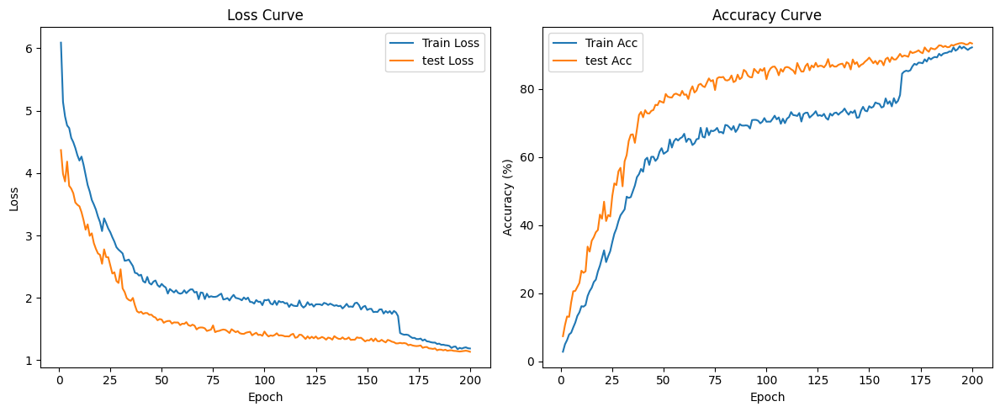

In [16]:
def plot_history(history):
    epochs = range(1, len(history['train_loss']) + 1)

    plt.figure(figsize=(12, 5))

    # Loss subplot
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history['train_loss'], label='Train Loss')
    plt.plot(epochs, history['test_loss'],  label='test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss Curve')
    plt.legend()

    # Accuracy subplot
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history['train_acc'], label='Train Acc')
    plt.plot(epochs, history['test_acc'],  label='test Acc')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title('Accuracy Curve')
    plt.legend()

    plt.tight_layout()
    plt.show()

# 3) Call it
plot_history(history)


Epoch 1/200:   0%|          | 0/410 [00:00<?, ?it/s]

Epoch 1/200: 100%|██████████| 410/410 [01:45<00:00,  3.90it/s, acc=2.76%, loss=6.8346]


Epoch 1: LR=0.000050

Epoch 1: Train 6.0898/2.76%, Val 4.3676/7.33%


Epoch 2/200: 100%|██████████| 410/410 [01:29<00:00,  4.58it/s, acc=4.96%, loss=5.6259]


Epoch 2: LR=0.000100

Epoch 2: Train 5.1404/4.96%, Val 3.9878/10.62%


Epoch 3/200: 100%|██████████| 410/410 [01:27<00:00,  4.71it/s, acc=6.18%, loss=4.4071]


Epoch 3: LR=0.000150

Epoch 3: Train 4.9059/6.18%, Val 3.8645/13.13%


Epoch 4/200: 100%|██████████| 410/410 [01:25<00:00,  4.82it/s, acc=7.83%, loss=4.9077]


Epoch 4: LR=0.000200

Epoch 4: Train 4.7629/7.83%, Val 4.1836/13.00%


Epoch 5/200: 100%|██████████| 410/410 [01:24<00:00,  4.87it/s, acc=8.35%, loss=4.3341]


Epoch 5: LR=0.000250

Epoch 5: Train 4.7212/8.35%, Val 3.7959/17.28%


Epoch 6/200: 100%|██████████| 410/410 [01:24<00:00,  4.83it/s, acc=9.89%, loss=6.0267]


Epoch 6: LR=0.000300

Epoch 6: Train 4.5637/9.89%, Val 3.7506/20.51%


Epoch 7/200: 100%|██████████| 410/410 [01:24<00:00,  4.83it/s, acc=11.33%, loss=5.3328]


Epoch 7: LR=0.000350

Epoch 7: Train 4.4951/11.33%, Val 3.6767/20.63%


Epoch 8/200: 100%|██████████| 410/410 [01:24<00:00,  4.85it/s, acc=13.28%, loss=6.3698]


Epoch 8: LR=0.000400

Epoch 8: Train 4.4011/13.28%, Val 3.5278/21.79%


Epoch 9/200: 100%|██████████| 410/410 [01:24<00:00,  4.85it/s, acc=14.33%, loss=7.0776]


Epoch 9: LR=0.000450

Epoch 9: Train 4.2855/14.33%, Val 3.4914/22.95%


Epoch 10/200: 100%|██████████| 410/410 [01:24<00:00,  4.86it/s, acc=16.13%, loss=4.2249]


Epoch 10: LR=0.000500

Epoch 10: Train 4.1999/16.13%, Val 3.4668/26.56%


Epoch 11/200: 100%|██████████| 410/410 [01:24<00:00,  4.83it/s, acc=16.00%, loss=3.6041]


Epoch 11: LR=0.000550

Epoch 11: Train 4.2635/16.00%, Val 3.3730/25.95%


Epoch 12/200: 100%|██████████| 410/410 [01:24<00:00,  4.84it/s, acc=16.49%, loss=3.2771]


Epoch 12: LR=0.000600

Epoch 12: Train 4.1312/16.49%, Val 3.2456/26.37%


Epoch 13/200: 100%|██████████| 410/410 [01:25<00:00,  4.81it/s, acc=19.13%, loss=4.0674]


Epoch 13: LR=0.000650

Epoch 13: Train 3.9683/19.13%, Val 3.0921/33.64%


Epoch 14/200: 100%|██████████| 410/410 [01:24<00:00,  4.83it/s, acc=20.58%, loss=4.5294]


Epoch 14: LR=0.000700

Epoch 14: Train 3.8079/20.58%, Val 3.1771/32.17%


Epoch 15/200: 100%|██████████| 410/410 [01:25<00:00,  4.81it/s, acc=21.55%, loss=3.2057]


Epoch 15: LR=0.000750

Epoch 15: Train 3.7038/21.55%, Val 2.9943/35.35%


Epoch 16/200: 100%|██████████| 410/410 [01:26<00:00,  4.72it/s, acc=23.22%, loss=3.2121]


Epoch 16: LR=0.000800

Epoch 16: Train 3.5697/23.22%, Val 3.0345/36.39%


Epoch 17/200: 100%|██████████| 410/410 [01:25<00:00,  4.81it/s, acc=23.94%, loss=2.2879]


Epoch 17: LR=0.000850

Epoch 17: Train 3.4967/23.94%, Val 2.8773/37.85%


Epoch 18/200: 100%|██████████| 410/410 [01:24<00:00,  4.83it/s, acc=26.32%, loss=3.9581]


Epoch 18: LR=0.000900

Epoch 18: Train 3.4143/26.32%, Val 2.7855/38.52%


Epoch 19/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=28.06%, loss=3.6200]


Epoch 19: LR=0.000950

Epoch 19: Train 3.3030/28.06%, Val 2.7120/43.04%


Epoch 20/200: 100%|██████████| 410/410 [01:25<00:00,  4.82it/s, acc=30.32%, loss=2.6335]


Epoch 20: LR=0.001000

Epoch 20: Train 3.2132/30.32%, Val 2.6889/41.82%


Epoch 21/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=32.54%, loss=3.5814]


Epoch 21: LR=0.002000

Epoch 21: Train 3.0702/32.54%, Val 2.5462/46.83%


Epoch 22/200: 100%|██████████| 410/410 [01:25<00:00,  4.82it/s, acc=29.09%, loss=2.7723]


Epoch 22: LR=0.002000

Epoch 22: Train 3.2739/29.09%, Val 2.7772/41.15%


Epoch 23/200: 100%|██████████| 410/410 [01:25<00:00,  4.81it/s, acc=30.79%, loss=4.3902]


Epoch 23: LR=0.002000

Epoch 23: Train 3.1964/30.79%, Val 2.6522/42.92%


Epoch 24/200: 100%|██████████| 410/410 [01:25<00:00,  4.82it/s, acc=32.29%, loss=3.0093]


Epoch 24: LR=0.002000

Epoch 24: Train 3.1120/32.29%, Val 2.6518/42.49%


Epoch 25/200: 100%|██████████| 410/410 [01:26<00:00,  4.77it/s, acc=34.96%, loss=3.7825]


Epoch 25: LR=0.002000

Epoch 25: Train 3.0521/34.96%, Val 2.5179/48.47%


Epoch 26/200: 100%|██████████| 410/410 [01:25<00:00,  4.82it/s, acc=37.40%, loss=2.9875]


Epoch 26: LR=0.002000

Epoch 26: Train 2.9715/37.40%, Val 2.3896/52.20%


Epoch 27/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=38.93%, loss=4.4238]


Epoch 27: LR=0.002000

Epoch 27: Train 2.9009/38.93%, Val 2.4090/51.71%


Epoch 28/200: 100%|██████████| 410/410 [01:24<00:00,  4.83it/s, acc=41.09%, loss=2.9948]


Epoch 28: LR=0.002000

Epoch 28: Train 2.8116/41.09%, Val 2.2701/55.74%


Epoch 29/200: 100%|██████████| 410/410 [01:25<00:00,  4.81it/s, acc=42.82%, loss=3.0221]


Epoch 29: LR=0.002000

Epoch 29: Train 2.7725/42.82%, Val 2.2384/56.78%


Epoch 30/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=43.69%, loss=3.6331]


Epoch 30: LR=0.002000

Epoch 30: Train 2.7438/43.69%, Val 2.4572/51.34%


Epoch 31/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=44.57%, loss=2.4090]


Epoch 31: LR=0.002000

Epoch 31: Train 2.7113/44.57%, Val 2.1511/58.67%


Epoch 32/200: 100%|██████████| 410/410 [01:27<00:00,  4.70it/s, acc=48.30%, loss=2.7909]


Epoch 32: LR=0.002000

Epoch 32: Train 2.5942/48.30%, Val 2.0930/60.50%


Epoch 33/200: 100%|██████████| 410/410 [01:31<00:00,  4.50it/s, acc=47.93%, loss=1.7966]


Epoch 33: LR=0.002000

Epoch 33: Train 2.5999/47.93%, Val 1.9963/64.65%


Epoch 34/200: 100%|██████████| 410/410 [01:25<00:00,  4.81it/s, acc=48.18%, loss=2.4751]


Epoch 34: LR=0.002000

Epoch 34: Train 2.6133/48.18%, Val 1.9666/66.48%


Epoch 35/200: 100%|██████████| 410/410 [01:25<00:00,  4.81it/s, acc=49.84%, loss=4.2886]


Epoch 35: LR=0.002000

Epoch 35: Train 2.5623/49.84%, Val 1.9525/66.61%


Epoch 36/200: 100%|██████████| 410/410 [01:25<00:00,  4.82it/s, acc=51.58%, loss=3.5073]


Epoch 36: LR=0.001500

Epoch 36: Train 2.5091/51.58%, Val 1.9988/64.10%


Epoch 37/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=54.04%, loss=2.2626]


Epoch 37: LR=0.001500

Epoch 37: Train 2.4014/54.04%, Val 1.8789/68.07%


Epoch 38/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=54.91%, loss=2.3556]


Epoch 38: LR=0.001500

Epoch 38: Train 2.3925/54.91%, Val 1.7850/72.28%


Epoch 39/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=56.45%, loss=3.3882]


Epoch 39: LR=0.001500

Epoch 39: Train 2.3566/56.45%, Val 1.7635/73.20%


Epoch 40/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=55.61%, loss=3.5000]


Epoch 40: LR=0.001500

Epoch 40: Train 2.3701/55.61%, Val 1.7779/71.61%


Epoch 41/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=59.14%, loss=1.7555]


Epoch 41: LR=0.001500

Epoch 41: Train 2.2668/59.14%, Val 1.7432/73.69%


Epoch 42/200: 100%|██████████| 410/410 [01:25<00:00,  4.81it/s, acc=59.75%, loss=1.7702]


Epoch 42: LR=0.001500

Epoch 42: Train 2.2442/59.75%, Val 1.7569/72.77%


Epoch 43/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=57.64%, loss=2.1396]


Epoch 43: LR=0.001500

Epoch 43: Train 2.3352/57.64%, Val 1.7560/72.71%


Epoch 44/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=60.01%, loss=4.3925]


Epoch 44: LR=0.001500

Epoch 44: Train 2.2371/60.01%, Val 1.7274/73.50%


Epoch 45/200: 100%|██████████| 410/410 [01:25<00:00,  4.82it/s, acc=60.02%, loss=1.4393]


Epoch 45: LR=0.001500

Epoch 45: Train 2.2134/60.02%, Val 1.7307/73.75%


Epoch 46/200: 100%|██████████| 410/410 [01:25<00:00,  4.82it/s, acc=58.80%, loss=3.2190]


Epoch 46: LR=0.001500

Epoch 46: Train 2.2604/58.80%, Val 1.6983/75.27%


Epoch 47/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=59.52%, loss=1.8591]


Epoch 47: LR=0.001500

Epoch 47: Train 2.2783/59.52%, Val 1.6842/75.15%


Epoch 48/200: 100%|██████████| 410/410 [01:25<00:00,  4.82it/s, acc=61.49%, loss=2.6523]


Epoch 48: LR=0.001500

Epoch 48: Train 2.2044/61.49%, Val 1.6402/76.43%


Epoch 49/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=62.54%, loss=1.9552]


Epoch 49: LR=0.001500

Epoch 49: Train 2.1746/62.54%, Val 1.6604/76.13%


Epoch 50/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=60.89%, loss=2.4713]


Epoch 50: LR=0.001500

Epoch 50: Train 2.2235/60.89%, Val 1.6521/75.89%


Epoch 51/200: 100%|██████████| 410/410 [01:32<00:00,  4.44it/s, acc=61.30%, loss=2.1971]


Epoch 51: LR=0.001500

Epoch 51: Train 2.1885/61.30%, Val 1.6002/78.45%


Epoch 52/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=61.76%, loss=2.6706]


Epoch 52: LR=0.001500

Epoch 52: Train 2.1655/61.76%, Val 1.6194/77.66%


Epoch 53/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=65.12%, loss=2.5380]


Epoch 53: LR=0.001500

Epoch 53: Train 2.0684/65.12%, Val 1.6292/77.47%


Epoch 54/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=62.72%, loss=1.7576]


Epoch 54: LR=0.001500

Epoch 54: Train 2.1412/62.72%, Val 1.6301/77.41%


Epoch 55/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=64.57%, loss=4.1965]


Epoch 55: LR=0.001500

Epoch 55: Train 2.1141/64.57%, Val 1.5873/78.33%


Epoch 56/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=65.32%, loss=3.5375]


Epoch 56: LR=0.001500

Epoch 56: Train 2.0863/65.32%, Val 1.6067/78.57%


Epoch 57/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=64.78%, loss=3.6481]


Epoch 57: LR=0.001500

Epoch 57: Train 2.1223/64.78%, Val 1.6046/78.27%


Epoch 58/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=65.43%, loss=1.6070]


Epoch 58: LR=0.001500

Epoch 58: Train 2.0800/65.43%, Val 1.6047/77.96%


Epoch 59/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=65.78%, loss=1.9599]


Epoch 59: LR=0.001500

Epoch 59: Train 2.0662/65.78%, Val 1.5627/79.37%


Epoch 60/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=66.77%, loss=2.0526]


Epoch 60: LR=0.001500

Epoch 60: Train 2.0763/66.77%, Val 1.5857/78.21%


Epoch 61/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=64.37%, loss=1.3290]


Epoch 61: LR=0.001500

Epoch 61: Train 2.1213/64.37%, Val 1.5823/78.33%


Epoch 62/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=65.32%, loss=3.7522]


Epoch 62: LR=0.001500

Epoch 62: Train 2.0748/65.32%, Val 1.6102/76.98%


Epoch 63/200: 100%|██████████| 410/410 [01:25<00:00,  4.81it/s, acc=65.09%, loss=3.0233]


Epoch 63: LR=0.001500

Epoch 63: Train 2.1082/65.09%, Val 1.5626/79.43%


Epoch 64/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=63.47%, loss=2.7275]


Epoch 64: LR=0.001500

Epoch 64: Train 2.1354/63.47%, Val 1.5495/80.71%


Epoch 65/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=63.96%, loss=1.3458]


Epoch 65: LR=0.001500

Epoch 65: Train 2.1356/63.96%, Val 1.5702/78.88%


Epoch 66/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=65.17%, loss=2.1042]


Epoch 66: LR=0.001500

Epoch 66: Train 2.0858/65.17%, Val 1.5539/79.49%


Epoch 67/200: 100%|██████████| 410/410 [01:26<00:00,  4.74it/s, acc=65.32%, loss=2.1721]


Epoch 67: LR=0.001500

Epoch 67: Train 2.0970/65.32%, Val 1.4935/81.14%


Epoch 68/200: 100%|██████████| 410/410 [01:26<00:00,  4.77it/s, acc=68.54%, loss=2.2857]


Epoch 68: LR=0.001500

Epoch 68: Train 1.9783/68.54%, Val 1.5197/81.44%


Epoch 69/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=65.90%, loss=2.2990]


Epoch 69: LR=0.001500

Epoch 69: Train 2.0864/65.90%, Val 1.5255/80.77%


Epoch 70/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=65.67%, loss=3.6975]


Epoch 70: LR=0.001500

Epoch 70: Train 2.0797/65.67%, Val 1.5237/80.46%


Epoch 71/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=68.48%, loss=2.3382]


Epoch 71: LR=0.001500

Epoch 71: Train 1.9802/68.48%, Val 1.5110/81.75%


Epoch 72/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=66.36%, loss=1.2926]


Epoch 72: LR=0.001500

Epoch 72: Train 2.0656/66.36%, Val 1.4694/83.03%


Epoch 73/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=67.70%, loss=2.3592]


Epoch 73: LR=0.001500

Epoch 73: Train 2.0092/67.70%, Val 1.4792/82.17%


Epoch 74/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=67.53%, loss=1.6866]


Epoch 74: LR=0.001500

Epoch 74: Train 2.0260/67.53%, Val 1.4904/82.54%


Epoch 75/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=67.84%, loss=2.4491]


Epoch 75: LR=0.001500

Epoch 75: Train 2.0161/67.84%, Val 1.5582/79.61%


Epoch 76/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=68.49%, loss=2.2068]


Epoch 76: LR=0.001500

Epoch 76: Train 2.0151/68.49%, Val 1.4503/83.03%


Epoch 77/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=67.17%, loss=1.4551]


Epoch 77: LR=0.001500

Epoch 77: Train 2.0235/67.17%, Val 1.4653/83.39%


Epoch 78/200: 100%|██████████| 410/410 [01:26<00:00,  4.77it/s, acc=67.32%, loss=3.9789]


Epoch 78: LR=0.001500

Epoch 78: Train 2.0476/67.32%, Val 1.4708/83.33%


Epoch 79/200: 100%|██████████| 410/410 [01:26<00:00,  4.74it/s, acc=66.88%, loss=2.1985]


Epoch 79: LR=0.001500

Epoch 79: Train 2.0672/66.88%, Val 1.4841/83.46%


Epoch 80/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=69.36%, loss=3.1715]


Epoch 80: LR=0.001500

Epoch 80: Train 1.9735/69.36%, Val 1.4922/82.54%


Epoch 81/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=69.21%, loss=3.1208]


Epoch 81: LR=0.001500

Epoch 81: Train 1.9811/69.21%, Val 1.4865/82.42%


Epoch 82/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=68.63%, loss=2.7058]


Epoch 82: LR=0.001500

Epoch 82: Train 1.9963/68.63%, Val 1.4644/82.72%


Epoch 83/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=67.91%, loss=2.4793]


Epoch 83: LR=0.001500

Epoch 83: Train 1.9577/67.91%, Val 1.4364/83.88%


Epoch 84/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=69.03%, loss=2.2526]


Epoch 84: LR=0.001500

Epoch 84: Train 2.0095/69.03%, Val 1.4971/81.93%


Epoch 85/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=67.30%, loss=2.8955]


Epoch 85: LR=0.001500

Epoch 85: Train 2.0479/67.30%, Val 1.4739/82.30%


Epoch 86/200: 100%|██████████| 410/410 [01:25<00:00,  4.81it/s, acc=68.16%, loss=1.1875]


Epoch 86: LR=0.001500

Epoch 86: Train 1.9994/68.16%, Val 1.4500/84.13%


Epoch 87/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=69.61%, loss=1.9928]


Epoch 87: LR=0.001500

Epoch 87: Train 1.9918/69.61%, Val 1.4663/82.78%


Epoch 88/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=69.20%, loss=2.9608]


Epoch 88: LR=0.001500

Epoch 88: Train 1.9810/69.20%, Val 1.4337/83.27%


Epoch 89/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=69.17%, loss=1.8793]


Epoch 89: LR=0.001500

Epoch 89: Train 1.9609/69.17%, Val 1.4237/85.53%


Epoch 90/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=69.24%, loss=3.7372]


Epoch 90: LR=0.001500

Epoch 90: Train 2.0064/69.24%, Val 1.4220/85.04%


Epoch 91/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=69.13%, loss=2.4890]


Epoch 91: LR=0.001500

Epoch 91: Train 1.9758/69.13%, Val 1.4406/83.82%


Epoch 92/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=68.31%, loss=2.9491]


Epoch 92: LR=0.001500

Epoch 92: Train 2.0039/68.31%, Val 1.4492/83.39%


Epoch 93/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=70.78%, loss=2.9216]


Epoch 93: LR=0.001500

Epoch 93: Train 1.9348/70.78%, Val 1.4555/83.33%


Epoch 94/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=70.86%, loss=1.5887]


Epoch 94: LR=0.001500

Epoch 94: Train 1.9316/70.86%, Val 1.3993/85.84%


Epoch 95/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=70.84%, loss=1.5077]


Epoch 95: LR=0.001500

Epoch 95: Train 1.9079/70.84%, Val 1.4217/85.16%


Epoch 96/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=70.60%, loss=1.3643]


Epoch 96: LR=0.001500

Epoch 96: Train 1.9643/70.60%, Val 1.4403/84.55%


Epoch 97/200: 100%|██████████| 410/410 [01:26<00:00,  4.74it/s, acc=69.84%, loss=2.2114]


Epoch 97: LR=0.001500

Epoch 97: Train 1.9362/69.84%, Val 1.4047/85.78%


Epoch 98/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=70.31%, loss=1.6859]


Epoch 98: LR=0.001500

Epoch 98: Train 1.9377/70.31%, Val 1.4097/85.23%


Epoch 99/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=71.38%, loss=1.2006]


Epoch 99: LR=0.001500

Epoch 99: Train 1.8825/71.38%, Val 1.3916/86.08%


Epoch 100/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=70.31%, loss=2.3280]


Epoch 100: LR=0.001500

Epoch 100: Train 1.9657/70.31%, Val 1.4599/82.78%


Epoch 101/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=70.34%, loss=1.3165]


Epoch 101: LR=0.001500

Epoch 101: Train 1.9605/70.34%, Val 1.4130/84.92%


Epoch 102/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=70.33%, loss=1.8327]


Epoch 102: LR=0.001500

Epoch 102: Train 1.9728/70.33%, Val 1.3813/85.96%


Epoch 103/200: 100%|██████████| 410/410 [01:26<00:00,  4.77it/s, acc=71.15%, loss=2.1485]


Epoch 103: LR=0.001500

Epoch 103: Train 1.9080/71.15%, Val 1.3980/86.45%


Epoch 104/200: 100%|██████████| 410/410 [01:26<00:00,  4.74it/s, acc=72.08%, loss=3.5991]


Epoch 104: LR=0.001500

Epoch 104: Train 1.8934/72.08%, Val 1.3904/86.51%


Epoch 105/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=71.00%, loss=2.0582]


Epoch 105: LR=0.001500

Epoch 105: Train 1.9524/71.00%, Val 1.4051/85.65%


Epoch 106/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=71.58%, loss=1.2740]


Epoch 106: LR=0.001500

Epoch 106: Train 1.8864/71.58%, Val 1.4324/83.94%


Epoch 107/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=69.70%, loss=1.7024]


Epoch 107: LR=0.001500

Epoch 107: Train 1.9492/69.70%, Val 1.3966/85.78%


Epoch 108/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=71.18%, loss=1.7300]


Epoch 108: LR=0.001500

Epoch 108: Train 1.9302/71.18%, Val 1.4006/84.98%


Epoch 109/200: 100%|██████████| 410/410 [01:26<00:00,  4.74it/s, acc=69.90%, loss=3.1513]


Epoch 109: LR=0.001500

Epoch 109: Train 1.9364/69.90%, Val 1.3943/86.20%


Epoch 110/200: 100%|██████████| 410/410 [01:26<00:00,  4.77it/s, acc=71.21%, loss=1.8253]


Epoch 110: LR=0.001500

Epoch 110: Train 1.9106/71.21%, Val 1.3824/86.39%


Epoch 111/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=71.68%, loss=2.6440]


Epoch 111: LR=0.001500

Epoch 111: Train 1.9169/71.68%, Val 1.3835/86.20%


Epoch 112/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=73.15%, loss=3.2819]


Epoch 112: LR=0.001500

Epoch 112: Train 1.8544/73.15%, Val 1.3808/85.71%


Epoch 113/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=72.26%, loss=2.2211]


Epoch 113: LR=0.001500

Epoch 113: Train 1.8985/72.26%, Val 1.4106/85.35%


Epoch 114/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=72.17%, loss=3.7579]


Epoch 114: LR=0.001500

Epoch 114: Train 1.8754/72.17%, Val 1.4232/84.37%


Epoch 115/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=72.00%, loss=1.4112]


Epoch 115: LR=0.001500

Epoch 115: Train 1.8696/72.00%, Val 1.3604/87.55%


Epoch 116/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=72.87%, loss=1.9666]


Epoch 116: LR=0.001500

Epoch 116: Train 1.8681/72.87%, Val 1.3686/86.14%


Epoch 117/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=70.36%, loss=2.1700]


Epoch 117: LR=0.001500

Epoch 117: Train 1.9587/70.36%, Val 1.4091/85.04%


Epoch 118/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=72.52%, loss=3.7239]


Epoch 118: LR=0.001500

Epoch 118: Train 1.8775/72.52%, Val 1.4064/85.04%


Epoch 119/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=72.92%, loss=1.5026]


Epoch 119: LR=0.001500

Epoch 119: Train 1.8441/72.92%, Val 1.3751/86.63%


Epoch 120/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=72.97%, loss=2.3377]


Epoch 120: LR=0.001500

Epoch 120: Train 1.8708/72.97%, Val 1.3406/87.36%


Epoch 121/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=71.52%, loss=2.9289]


Epoch 121: LR=0.001500

Epoch 121: Train 1.9308/71.52%, Val 1.3828/85.41%


Epoch 122/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=72.05%, loss=2.3332]


Epoch 122: LR=0.001500

Epoch 122: Train 1.8853/72.05%, Val 1.3486/86.81%


Epoch 123/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=72.61%, loss=1.5841]


Epoch 123: LR=0.001500

Epoch 123: Train 1.9015/72.61%, Val 1.3773/86.26%


Epoch 124/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=73.39%, loss=3.1040]


Epoch 124: LR=0.001500

Epoch 124: Train 1.8594/73.39%, Val 1.3519/87.61%


Epoch 125/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=72.07%, loss=1.4715]


Epoch 125: LR=0.001500

Epoch 125: Train 1.8958/72.07%, Val 1.3811/86.45%


Epoch 126/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=72.23%, loss=1.4273]


Epoch 126: LR=0.001500

Epoch 126: Train 1.8971/72.23%, Val 1.3456/86.75%


Epoch 127/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=71.96%, loss=1.7937]


Epoch 127: LR=0.001500

Epoch 127: Train 1.8957/71.96%, Val 1.3549/86.69%


Epoch 128/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=72.61%, loss=1.8132]


Epoch 128: LR=0.001500

Epoch 128: Train 1.8824/72.61%, Val 1.3732/86.26%


Epoch 129/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=71.41%, loss=1.6326]


Epoch 129: LR=0.001500

Epoch 129: Train 1.9193/71.41%, Val 1.3573/87.06%


Epoch 130/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=70.91%, loss=1.3767]


Epoch 130: LR=0.001500

Epoch 130: Train 1.9089/70.91%, Val 1.3297/88.71%


Epoch 131/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=72.69%, loss=1.7428]


Epoch 131: LR=0.001500

Epoch 131: Train 1.8856/72.69%, Val 1.3634/86.39%


Epoch 132/200: 100%|██████████| 410/410 [01:25<00:00,  4.81it/s, acc=72.10%, loss=1.6013]


Epoch 132: LR=0.001500

Epoch 132: Train 1.9065/72.10%, Val 1.3540/87.00%


Epoch 133/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=72.84%, loss=2.1627]


Epoch 133: LR=0.001500

Epoch 133: Train 1.8902/72.84%, Val 1.3296/86.51%


Epoch 134/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=73.00%, loss=2.3207]


Epoch 134: LR=0.001500

Epoch 134: Train 1.8719/73.00%, Val 1.3861/86.51%


Epoch 135/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=72.36%, loss=1.6337]


Epoch 135: LR=0.001500

Epoch 135: Train 1.8820/72.36%, Val 1.3616/87.00%


Epoch 136/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=72.97%, loss=1.5906]


Epoch 136: LR=0.001500

Epoch 136: Train 1.8665/72.97%, Val 1.3444/87.24%


Epoch 137/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=73.35%, loss=1.7380]


Epoch 137: LR=0.001500

Epoch 137: Train 1.8730/73.35%, Val 1.3405/87.36%


Epoch 138/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=74.17%, loss=1.8002]


Epoch 138: LR=0.001500

Epoch 138: Train 1.8295/74.17%, Val 1.3666/86.20%


Epoch 139/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=73.13%, loss=3.6148]


Epoch 139: LR=0.001500

Epoch 139: Train 1.8615/73.13%, Val 1.3382/87.79%


Epoch 140/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=72.37%, loss=2.2952]


Epoch 140: LR=0.001500

Epoch 140: Train 1.9039/72.37%, Val 1.3418/87.42%


Epoch 141/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=73.29%, loss=3.6406]



Epoch 141: Train 1.8571/73.29%, Val 1.3654/85.65%


Epoch 142/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=72.87%, loss=1.4336]



Epoch 142: Train 1.8611/72.87%, Val 1.3262/88.58%


Epoch 143/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=73.64%, loss=1.8614]



Epoch 143: Train 1.8551/73.64%, Val 1.3292/87.24%


Epoch 144/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=71.45%, loss=1.5764]



Epoch 144: Train 1.9145/71.45%, Val 1.3291/87.79%


Epoch 145/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=71.59%, loss=2.9560]



Epoch 145: Train 1.9227/71.59%, Val 1.3667/86.39%


Epoch 146/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=73.55%, loss=1.4033]



Epoch 146: Train 1.8839/73.55%, Val 1.3578/87.00%


Epoch 147/200: 100%|██████████| 410/410 [01:25<00:00,  4.79it/s, acc=74.69%, loss=2.7482]



Epoch 147: Train 1.8136/74.69%, Val 1.3602/87.30%


Epoch 148/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=73.56%, loss=1.7680]



Epoch 148: Train 1.8566/73.56%, Val 1.3316/87.97%


Epoch 149/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=73.36%, loss=2.3505]



Epoch 149: Train 1.8712/73.36%, Val 1.3021/88.46%


Epoch 150/200: 100%|██████████| 410/410 [01:27<00:00,  4.68it/s, acc=74.87%, loss=2.2573]



Epoch 150: Train 1.8056/74.87%, Val 1.3212/89.13%


Epoch 151/200: 100%|██████████| 410/410 [01:26<00:00,  4.73it/s, acc=74.40%, loss=1.6428]



Epoch 151: Train 1.8221/74.40%, Val 1.3168/88.34%


Epoch 152/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=74.72%, loss=3.4961]



Epoch 152: Train 1.8242/74.72%, Val 1.3468/87.48%


Epoch 153/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=75.96%, loss=1.9456]



Epoch 153: Train 1.7717/75.96%, Val 1.3050/88.16%


Epoch 154/200: 100%|██████████| 410/410 [01:26<00:00,  4.77it/s, acc=75.68%, loss=1.1421]



Epoch 154: Train 1.7764/75.68%, Val 1.3490/87.18%


Epoch 155/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=75.53%, loss=1.5746]



Epoch 155: Train 1.7736/75.53%, Val 1.3059/88.22%


Epoch 156/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=74.48%, loss=1.9356]



Epoch 156: Train 1.8141/74.48%, Val 1.3034/88.10%


Epoch 157/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=74.75%, loss=1.6626]



Epoch 157: Train 1.8162/74.75%, Val 1.3274/86.87%


Epoch 158/200: 100%|██████████| 410/410 [01:26<00:00,  4.77it/s, acc=77.15%, loss=3.8136]



Epoch 158: Train 1.7481/77.15%, Val 1.3037/88.71%


Epoch 159/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=75.56%, loss=1.8635]



Epoch 159: Train 1.7883/75.56%, Val 1.2863/89.13%


Epoch 160/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=76.32%, loss=1.6386]



Epoch 160: Train 1.7609/76.32%, Val 1.3260/87.85%


Epoch 161/200: 100%|██████████| 410/410 [01:26<00:00,  4.77it/s, acc=74.81%, loss=1.3977]



Epoch 161: Train 1.7871/74.81%, Val 1.3149/89.26%


Epoch 162/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=77.21%, loss=1.1205]



Epoch 162: Train 1.7431/77.21%, Val 1.2974/88.58%


Epoch 163/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=75.76%, loss=1.4221]



Epoch 163: Train 1.7900/75.76%, Val 1.2892/88.58%


Epoch 164/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=76.45%, loss=2.0361]



Epoch 164: Train 1.7655/76.45%, Val 1.2700/89.32%


Epoch 165/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=78.14%, loss=1.3833]



Epoch 165: Train 1.7076/78.14%, Val 1.2702/90.23%


Epoch 166/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=84.43%, loss=0.9962]



Epoch 166: Train 1.4365/84.43%, Val 1.2784/89.38%


Epoch 167/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=85.01%, loss=1.1737]



Epoch 167: Train 1.4186/85.01%, Val 1.2710/89.74%


Epoch 168/200: 100%|██████████| 410/410 [01:25<00:00,  4.80it/s, acc=85.30%, loss=1.1233]



Epoch 168: Train 1.4086/85.30%, Val 1.2754/89.62%


Epoch 169/200: 100%|██████████| 410/410 [01:25<00:00,  4.78it/s, acc=85.13%, loss=1.3426]



Epoch 169: Train 1.4111/85.13%, Val 1.2678/89.38%


Epoch 170/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=85.41%, loss=1.3141]



Epoch 170: Train 1.4038/85.41%, Val 1.2410/90.96%


Epoch 171/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=86.55%, loss=2.4926]



Epoch 171: Train 1.3776/86.55%, Val 1.2500/90.48%


Epoch 172/200: 100%|██████████| 410/410 [01:26<00:00,  4.77it/s, acc=87.31%, loss=1.9301]



Epoch 172: Train 1.3575/87.31%, Val 1.2377/90.66%


Epoch 173/200: 100%|██████████| 410/410 [01:26<00:00,  4.77it/s, acc=87.02%, loss=1.5404]



Epoch 173: Train 1.3583/87.02%, Val 1.2303/90.90%


Epoch 174/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=87.67%, loss=1.0581]



Epoch 174: Train 1.3395/87.67%, Val 1.2267/91.27%


Epoch 175/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=87.62%, loss=1.1704]



Epoch 175: Train 1.3390/87.62%, Val 1.2298/90.72%


Epoch 176/200: 100%|██████████| 410/410 [01:26<00:00,  4.74it/s, acc=87.48%, loss=1.7227]



Epoch 176: Train 1.3472/87.48%, Val 1.2366/90.42%


Epoch 177/200: 100%|██████████| 410/410 [01:26<00:00,  4.72it/s, acc=88.63%, loss=1.6023]



Epoch 177: Train 1.3150/88.63%, Val 1.1995/92.12%


Epoch 178/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=87.97%, loss=1.4167]



Epoch 178: Train 1.3329/87.97%, Val 1.2098/91.33%


Epoch 179/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=89.12%, loss=2.0378]



Epoch 179: Train 1.3035/89.12%, Val 1.2126/90.84%


Epoch 180/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=88.61%, loss=0.9691]



Epoch 180: Train 1.2994/88.61%, Val 1.1910/91.94%


Epoch 181/200: 100%|██████████| 410/410 [01:26<00:00,  4.74it/s, acc=89.09%, loss=1.5238]



Epoch 181: Train 1.2884/89.09%, Val 1.1873/91.70%


Epoch 182/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=89.33%, loss=1.5715]



Epoch 182: Train 1.2827/89.33%, Val 1.1817/91.58%


Epoch 183/200: 100%|██████████| 410/410 [01:26<00:00,  4.74it/s, acc=89.19%, loss=1.1149]



Epoch 183: Train 1.2830/89.19%, Val 1.1901/92.06%


Epoch 184/200: 100%|██████████| 410/410 [01:26<00:00,  4.73it/s, acc=90.26%, loss=0.9591]



Epoch 184: Train 1.2608/90.26%, Val 1.1598/92.74%


Epoch 185/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=89.71%, loss=1.0694]



Epoch 185: Train 1.2665/89.71%, Val 1.1706/92.67%


Epoch 186/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=90.29%, loss=1.6013]



Epoch 186: Train 1.2480/90.29%, Val 1.1696/92.25%


Epoch 187/200: 100%|██████████| 410/410 [01:26<00:00,  4.73it/s, acc=90.49%, loss=1.7107]



Epoch 187: Train 1.2491/90.49%, Val 1.1589/92.55%


Epoch 188/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=90.58%, loss=1.7471]



Epoch 188: Train 1.2405/90.58%, Val 1.1686/92.19%


Epoch 189/200: 100%|██████████| 410/410 [01:26<00:00,  4.76it/s, acc=90.95%, loss=1.5870]



Epoch 189: Train 1.2374/90.95%, Val 1.1523/92.25%


Epoch 190/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=90.87%, loss=1.6098]



Epoch 190: Train 1.2289/90.87%, Val 1.1580/92.86%


Epoch 191/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=92.14%, loss=1.9024]



Epoch 191: Train 1.1973/92.14%, Val 1.1603/92.67%


Epoch 192/200: 100%|██████████| 410/410 [01:26<00:00,  4.74it/s, acc=91.16%, loss=1.3564]



Epoch 192: Train 1.2162/91.16%, Val 1.1505/92.98%


Epoch 193/200: 100%|██████████| 410/410 [01:26<00:00,  4.74it/s, acc=91.59%, loss=1.1293]



Epoch 193: Train 1.2196/91.59%, Val 1.1486/93.16%


Epoch 194/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=92.49%, loss=1.3949]



Epoch 194: Train 1.1770/92.49%, Val 1.1441/93.35%


Epoch 195/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=91.80%, loss=1.3176]



Epoch 195: Train 1.1986/91.80%, Val 1.1394/93.41%


Epoch 196/200: 100%|██████████| 410/410 [01:25<00:00,  4.77it/s, acc=92.34%, loss=1.2950]



Epoch 196: Train 1.1864/92.34%, Val 1.1437/93.28%


Epoch 197/200: 100%|██████████| 410/410 [01:26<00:00,  4.74it/s, acc=91.83%, loss=2.0142]



Epoch 197: Train 1.2000/91.83%, Val 1.1480/92.98%


Epoch 198/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=91.39%, loss=1.4519]



Epoch 198: Train 1.2068/91.39%, Val 1.1530/93.04%


Epoch 199/200: 100%|██████████| 410/410 [01:26<00:00,  4.75it/s, acc=91.88%, loss=1.3437]



Epoch 199: Train 1.1924/91.88%, Val 1.1468/93.53%


Epoch 200/200: 100%|██████████| 410/410 [01:26<00:00,  4.74it/s, acc=92.14%, loss=1.0511]



Epoch 200: Train 1.1882/92.14%, Val 1.1361/93.28%
Updating SWA BatchNorm stats…
SWA Acc = 92.49%
Best test accuracy: 93.53%
Saved best model to D:\Downloads\best_model.pth


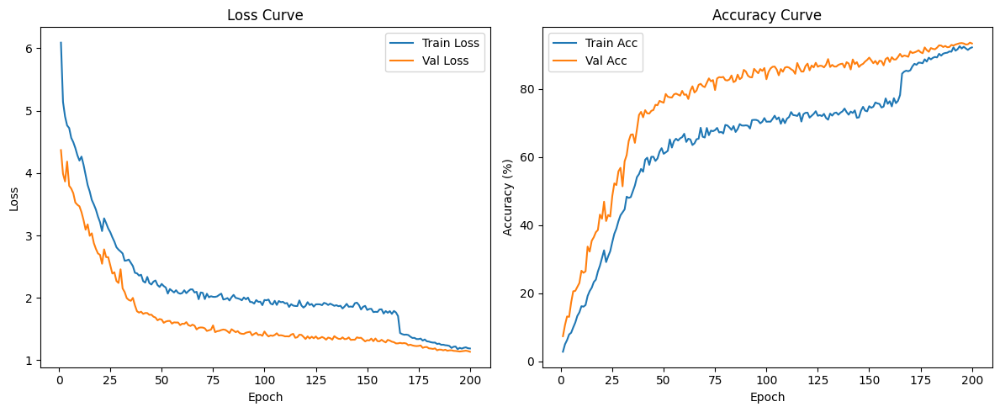

In [15]:
# 1) Unpack the return values
model, history = advanced_fit(
    model=model,
    train_loader=train_loader,
    test_loader=test_loader,
    num_epochs=200
)

# 2) Define a plotting helper
import matplotlib.pyplot as plt

def plot_history(history):
    epochs = range(1, len(history['train_loss']) + 1)

    plt.figure(figsize=(12, 5))

    # Loss subplot
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history['train_loss'], label='Train Loss')
    plt.plot(epochs, history['test_loss'],  label='test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss Curve')
    plt.legend()

    # Accuracy subplot
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history['train_acc'], label='Train Acc')
    plt.plot(epochs, history['test_acc'],  label='test Acc')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title('Accuracy Curve')
    plt.legend()

    plt.tight_layout()
    plt.show()

# 3) Call it
plot_history(history)


In [12]:
# Initialize model with correct number of classes
num_classes = len(class_names)
print(f"Number of classes: {num_classes}")

model = FlowerCNN(num_classes=num_classes)
model = model.to(device)



Number of classes: 102


In [15]:
history

(FlowerCNN(
   (features): Sequential(
     (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
     (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (2): ReLU(inplace=True)
     (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
     (4): Dropout2d(p=0.1, inplace=False)
     (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (7): ReLU(inplace=True)
     (8): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (10): ReLU(inplace=True)
     (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
     (12): Dropout2d(p=0.15, inplace=False)
     (13): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (14): BatchNorm2d(256, eps=1e-

In [14]:
import matplotlib.pyplot as plt

def plot_accuracy(history):
    """
    Plots training & validation accuracy curves from history dict.
    """
    epochs = range(1, len(history['train_acc']) + 1)
    plt.figure(figsize=(8,4))
    plt.plot(epochs, history['train_acc'], label='Train Acc')
    plt.plot(epochs, history['test_acc'],  label='Test Acc')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.title('Training vs. test Accuracy')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [13]:
# Initialize model with correct number of classes
num_classes = len(class_names)
print(f"Number of classes: {num_classes}")

model = FlowerCNN(num_classes=num_classes)
model = model.to(device)

# Train the model
history = advanced_fit(
    model=model,
    train_loader=train_loader,
    test_loader=test_loader,
    num_epochs=200
)

Number of classes: 102


Epoch 1/200: 100%|██████████| 410/410 [01:36<00:00,  4.24it/s, acc=2.89%, loss=6.8796]


Epoch 1: LR=0.000050

Epoch 1: Train 6.2949/2.89%, Val 4.4614/6.59%


Epoch 2/200: 100%|██████████| 410/410 [01:18<00:00,  5.21it/s, acc=3.66%, loss=4.7612]


Epoch 2: LR=0.000100

Epoch 2: Train 5.3039/3.66%, Val 4.1417/9.10%


Epoch 3/200: 100%|██████████| 410/410 [01:15<00:00,  5.45it/s, acc=4.82%, loss=5.9361]


Epoch 3: LR=0.000150

Epoch 3: Train 5.0978/4.82%, Val 4.1405/12.21%


Epoch 4/200: 100%|██████████| 410/410 [01:20<00:00,  5.07it/s, acc=6.44%, loss=4.5210]


Epoch 4: LR=0.000200

Epoch 4: Train 4.9248/6.44%, Val 4.0216/15.45%


Epoch 5/200: 100%|██████████| 410/410 [01:15<00:00,  5.40it/s, acc=7.80%, loss=4.9513]


Epoch 5: LR=0.000250

Epoch 5: Train 4.8440/7.80%, Val 4.0670/19.90%


Epoch 6/200: 100%|██████████| 410/410 [01:15<00:00,  5.43it/s, acc=9.68%, loss=5.5444]


Epoch 6: LR=0.000300

Epoch 6: Train 4.7108/9.68%, Val 3.6051/21.12%


Epoch 7/200: 100%|██████████| 410/410 [01:14<00:00,  5.48it/s, acc=11.25%, loss=5.7504]


Epoch 7: LR=0.000350

Epoch 7: Train 4.5888/11.25%, Val 3.4781/22.95%


Epoch 8/200: 100%|██████████| 410/410 [01:15<00:00,  5.45it/s, acc=13.48%, loss=7.4728]


Epoch 8: LR=0.000400

Epoch 8: Train 4.4054/13.48%, Val 3.3832/25.70%


Epoch 9/200: 100%|██████████| 410/410 [01:15<00:00,  5.44it/s, acc=13.88%, loss=4.6404]


Epoch 9: LR=0.000450

Epoch 9: Train 4.3353/13.88%, Val 3.4394/25.21%


Epoch 10/200: 100%|██████████| 410/410 [01:15<00:00,  5.41it/s, acc=16.18%, loss=4.4451]


Epoch 10: LR=0.000500

Epoch 10: Train 4.1523/16.18%, Val 3.4382/26.98%


Epoch 11/200: 100%|██████████| 410/410 [01:16<00:00,  5.39it/s, acc=13.01%, loss=5.2692]


Epoch 11: LR=0.000550

Epoch 11: Train 4.5264/13.01%, Val 3.4397/25.46%


Epoch 12/200: 100%|██████████| 410/410 [01:15<00:00,  5.43it/s, acc=12.72%, loss=5.0677]


Epoch 12: LR=0.000600

Epoch 12: Train 4.4555/12.72%, Val 3.2931/29.79%


Epoch 13/200: 100%|██████████| 410/410 [01:16<00:00,  5.38it/s, acc=14.23%, loss=3.7572]


Epoch 13: LR=0.000650

Epoch 13: Train 4.2365/14.23%, Val 3.2695/30.89%


Epoch 14/200: 100%|██████████| 410/410 [01:15<00:00,  5.41it/s, acc=15.54%, loss=3.0092]


Epoch 14: LR=0.000700

Epoch 14: Train 4.0921/15.54%, Val 3.1103/32.66%


Epoch 15/200: 100%|██████████| 410/410 [01:15<00:00,  5.42it/s, acc=17.69%, loss=5.1017]


Epoch 15: LR=0.000750

Epoch 15: Train 3.9114/17.69%, Val 3.1421/33.46%


Epoch 16/200: 100%|██████████| 410/410 [01:15<00:00,  5.41it/s, acc=18.97%, loss=3.8470]


Epoch 16: LR=0.000800

Epoch 16: Train 3.8220/18.97%, Val 3.1653/29.79%


Epoch 17/200: 100%|██████████| 410/410 [01:15<00:00,  5.40it/s, acc=20.15%, loss=4.7415]


Epoch 17: LR=0.000850

Epoch 17: Train 3.7292/20.15%, Val 3.3558/25.40%


Epoch 18/200: 100%|██████████| 410/410 [01:16<00:00,  5.37it/s, acc=21.22%, loss=3.7824]


Epoch 18: LR=0.000900

Epoch 18: Train 3.6484/21.22%, Val 2.9440/38.95%


Epoch 19/200: 100%|██████████| 410/410 [01:15<00:00,  5.40it/s, acc=23.84%, loss=3.6119]


Epoch 19: LR=0.000950

Epoch 19: Train 3.5473/23.84%, Val 2.7768/40.96%


Epoch 20/200: 100%|██████████| 410/410 [01:16<00:00,  5.39it/s, acc=24.41%, loss=3.4817]


Epoch 20: LR=0.001000

Epoch 20: Train 3.5033/24.41%, Val 2.7712/40.29%


Epoch 21/200: 100%|██████████| 410/410 [01:16<00:00,  5.39it/s, acc=26.41%, loss=4.5053]


Epoch 21: LR=0.002000

Epoch 21: Train 3.4426/26.41%, Val 2.7793/39.74%


Epoch 22/200: 100%|██████████| 410/410 [01:16<00:00,  5.39it/s, acc=22.23%, loss=4.0023]


Epoch 22: LR=0.002000

Epoch 22: Train 3.5873/22.23%, Val 2.8597/36.75%


Epoch 23/200: 100%|██████████| 410/410 [01:16<00:00,  5.39it/s, acc=24.10%, loss=2.0456]


Epoch 23: LR=0.002000

Epoch 23: Train 3.5307/24.10%, Val 2.7638/40.05%


Epoch 24/200: 100%|██████████| 410/410 [01:15<00:00,  5.40it/s, acc=27.19%, loss=2.8306]


Epoch 24: LR=0.002000

Epoch 24: Train 3.3929/27.19%, Val 2.6905/42.37%


Epoch 25/200: 100%|██████████| 410/410 [01:16<00:00,  5.37it/s, acc=27.14%, loss=4.4708]


Epoch 25: LR=0.002000

Epoch 25: Train 3.3912/27.14%, Val 2.6132/44.63%


Epoch 26/200: 100%|██████████| 410/410 [01:15<00:00,  5.41it/s, acc=27.84%, loss=3.1459]


Epoch 26: LR=0.002000

Epoch 26: Train 3.3264/27.84%, Val 2.6142/45.97%


Epoch 27/200: 100%|██████████| 410/410 [01:15<00:00,  5.40it/s, acc=30.56%, loss=2.5404]


Epoch 27: LR=0.002000

Epoch 27: Train 3.2660/30.56%, Val 2.4736/49.08%


Epoch 28/200: 100%|██████████| 410/410 [01:15<00:00,  5.40it/s, acc=32.39%, loss=2.8478]


Epoch 28: LR=0.002000

Epoch 28: Train 3.2136/32.39%, Val 2.4689/50.18%


Epoch 29/200: 100%|██████████| 410/410 [01:15<00:00,  5.40it/s, acc=34.68%, loss=2.9130]


Epoch 29: LR=0.002000

Epoch 29: Train 3.1477/34.68%, Val 2.5294/49.08%


Epoch 30/200: 100%|██████████| 410/410 [01:16<00:00,  5.37it/s, acc=35.12%, loss=4.5104]


Epoch 30: LR=0.002000

Epoch 30: Train 3.1445/35.12%, Val 2.3357/52.26%


Epoch 31/200: 100%|██████████| 410/410 [01:15<00:00,  5.40it/s, acc=36.42%, loss=3.8166]


Epoch 31: LR=0.002000

Epoch 31: Train 3.0610/36.42%, Val 2.3203/51.22%


Epoch 32/200: 100%|██████████| 410/410 [01:16<00:00,  5.38it/s, acc=36.33%, loss=2.7956]


Epoch 32: LR=0.002000

Epoch 32: Train 3.0483/36.33%, Val 2.2429/56.59%


Epoch 33/200: 100%|██████████| 410/410 [01:16<00:00,  5.38it/s, acc=38.97%, loss=2.6427]


Epoch 33: LR=0.002000

Epoch 33: Train 2.9999/38.97%, Val 2.2406/56.35%


Epoch 34/200: 100%|██████████| 410/410 [01:16<00:00,  5.34it/s, acc=38.96%, loss=2.1898]


Epoch 34: LR=0.002000

Epoch 34: Train 2.9871/38.96%, Val 2.1623/60.44%


Epoch 35/200: 100%|██████████| 410/410 [01:16<00:00,  5.35it/s, acc=38.27%, loss=3.9211]


Epoch 35: LR=0.002000

Epoch 35: Train 2.9912/38.27%, Val 2.0869/63.68%


Epoch 36/200: 100%|██████████| 410/410 [01:15<00:00,  5.40it/s, acc=42.74%, loss=2.3670]


Epoch 36: LR=0.002000

Epoch 36: Train 2.8606/42.74%, Val 2.1401/60.44%


Epoch 37/200: 100%|██████████| 410/410 [01:16<00:00,  5.38it/s, acc=41.43%, loss=2.3276]


Epoch 37: LR=0.002000

Epoch 37: Train 2.9027/41.43%, Val 2.0261/64.71%


Epoch 38/200: 100%|██████████| 410/410 [01:16<00:00,  5.39it/s, acc=42.80%, loss=3.8348]


Epoch 38: LR=0.002000

Epoch 38: Train 2.8672/42.80%, Val 1.9998/65.02%


Epoch 39/200: 100%|██████████| 410/410 [01:16<00:00,  5.39it/s, acc=44.48%, loss=3.4871]


Epoch 39: LR=0.002000

Epoch 39: Train 2.8068/44.48%, Val 2.0767/62.09%


Epoch 40/200: 100%|██████████| 410/410 [01:16<00:00,  5.36it/s, acc=45.21%, loss=2.8341]


Epoch 40: LR=0.002000

Epoch 40: Train 2.8052/45.21%, Val 1.9352/68.07%


Epoch 41/200: 100%|██████████| 410/410 [01:15<00:00,  5.40it/s, acc=44.89%, loss=2.2686]


Epoch 41: LR=0.002000

Epoch 41: Train 2.7953/44.89%, Val 1.9642/66.30%


Epoch 42/200: 100%|██████████| 410/410 [01:16<00:00,  5.38it/s, acc=46.12%, loss=2.5593]


Epoch 42: LR=0.002000

Epoch 42: Train 2.7645/46.12%, Val 1.9780/65.81%


Epoch 43/200: 100%|██████████| 410/410 [01:16<00:00,  5.37it/s, acc=46.44%, loss=2.7133]


Epoch 43: LR=0.002000

Epoch 43: Train 2.7599/46.44%, Val 1.8981/67.16%


Epoch 44/200: 100%|██████████| 410/410 [01:16<00:00,  5.37it/s, acc=48.21%, loss=2.2227]


Epoch 44: LR=0.002000

Epoch 44: Train 2.7190/48.21%, Val 1.9424/66.54%


Epoch 45/200: 100%|██████████| 410/410 [01:16<00:00,  5.38it/s, acc=48.40%, loss=4.2836]


Epoch 45: LR=0.002000

Epoch 45: Train 2.6911/48.40%, Val 1.8695/69.35%


Epoch 46/200: 100%|██████████| 410/410 [01:16<00:00,  5.35it/s, acc=48.15%, loss=2.1361]


Epoch 46: LR=0.002000

Epoch 46: Train 2.7194/48.15%, Val 1.8330/69.66%


Epoch 47/200: 100%|██████████| 410/410 [01:17<00:00,  5.30it/s, acc=47.46%, loss=3.3119]


Epoch 47: LR=0.002000

Epoch 47: Train 2.7255/47.46%, Val 1.8215/70.82%


Epoch 48/200: 100%|██████████| 410/410 [01:16<00:00,  5.33it/s, acc=48.71%, loss=3.2936]


Epoch 48: LR=0.002000

Epoch 48: Train 2.6770/48.71%, Val 1.8407/70.82%


Epoch 49/200: 100%|██████████| 410/410 [01:17<00:00,  5.29it/s, acc=49.08%, loss=4.3374]


Epoch 49: LR=0.002000

Epoch 49: Train 2.7032/49.08%, Val 1.8355/70.94%


Epoch 50/200: 100%|██████████| 410/410 [01:16<00:00,  5.33it/s, acc=48.48%, loss=3.0757]


Epoch 50: LR=0.002000

Epoch 50: Train 2.6930/48.48%, Val 1.8083/71.79%


Epoch 51/200: 100%|██████████| 410/410 [01:17<00:00,  5.32it/s, acc=50.08%, loss=2.5023]


Epoch 51: LR=0.001500

Epoch 51: Train 2.6680/50.08%, Val 1.7887/71.55%


Epoch 52/200: 100%|██████████| 410/410 [01:17<00:00,  5.27it/s, acc=51.70%, loss=4.4134]


Epoch 52: LR=0.001500

Epoch 52: Train 2.5611/51.70%, Val 1.6744/74.97%


Epoch 53/200: 100%|██████████| 410/410 [01:17<00:00,  5.31it/s, acc=52.77%, loss=4.0989]


Epoch 53: LR=0.001500

Epoch 53: Train 2.5707/52.77%, Val 1.6672/75.09%


Epoch 54/200: 100%|██████████| 410/410 [01:17<00:00,  5.28it/s, acc=54.97%, loss=2.1989]


Epoch 54: LR=0.001500

Epoch 54: Train 2.4757/54.97%, Val 1.6454/76.13%


Epoch 55/200: 100%|██████████| 410/410 [01:17<00:00,  5.31it/s, acc=54.21%, loss=1.9575]


Epoch 55: LR=0.001500

Epoch 55: Train 2.5360/54.21%, Val 1.6363/76.92%


Epoch 56/200: 100%|██████████| 410/410 [01:17<00:00,  5.31it/s, acc=54.75%, loss=2.1360]


Epoch 56: LR=0.001500

Epoch 56: Train 2.5117/54.75%, Val 1.6277/77.29%


Epoch 57/200: 100%|██████████| 410/410 [01:17<00:00,  5.27it/s, acc=55.66%, loss=2.3621]


Epoch 57: LR=0.001500

Epoch 57: Train 2.4703/55.66%, Val 1.6750/76.56%


Epoch 58/200: 100%|██████████| 410/410 [01:16<00:00,  5.33it/s, acc=56.04%, loss=3.5147]


Epoch 58: LR=0.001500

Epoch 58: Train 2.4430/56.04%, Val 1.6392/77.41%


Epoch 59/200: 100%|██████████| 410/410 [01:17<00:00,  5.28it/s, acc=54.50%, loss=2.8547]


Epoch 59: LR=0.001500

Epoch 59: Train 2.4909/54.50%, Val 1.6317/76.56%


Epoch 60/200: 100%|██████████| 410/410 [01:17<00:00,  5.31it/s, acc=53.18%, loss=2.4710]


Epoch 60: LR=0.001500

Epoch 60: Train 2.5433/53.18%, Val 1.6319/77.78%


Epoch 61/200: 100%|██████████| 410/410 [01:17<00:00,  5.31it/s, acc=56.33%, loss=1.7944]


Epoch 61: LR=0.001500

Epoch 61: Train 2.4662/56.33%, Val 1.6719/76.07%


Epoch 62/200: 100%|██████████| 410/410 [01:17<00:00,  5.31it/s, acc=54.98%, loss=2.8265]


Epoch 62: LR=0.001500

Epoch 62: Train 2.4748/54.98%, Val 1.5973/78.45%


Epoch 63/200: 100%|██████████| 410/410 [01:17<00:00,  5.32it/s, acc=53.98%, loss=2.0862]


Epoch 63: LR=0.001500

Epoch 63: Train 2.5370/53.98%, Val 1.5729/79.55%


Epoch 64/200: 100%|██████████| 410/410 [01:17<00:00,  5.31it/s, acc=55.00%, loss=3.2466]


Epoch 64: LR=0.001500

Epoch 64: Train 2.4905/55.00%, Val 1.6256/77.53%


Epoch 65/200: 100%|██████████| 410/410 [01:16<00:00,  5.34it/s, acc=57.29%, loss=2.1650]


Epoch 65: LR=0.001500

Epoch 65: Train 2.4449/57.29%, Val 1.5769/78.69%


Epoch 66/200: 100%|██████████| 410/410 [01:17<00:00,  5.32it/s, acc=56.50%, loss=2.0162]


Epoch 66: LR=0.001500

Epoch 66: Train 2.4405/56.50%, Val 1.6162/77.53%


Epoch 67/200: 100%|██████████| 410/410 [01:16<00:00,  5.33it/s, acc=55.88%, loss=4.5236]


Epoch 67: LR=0.001500

Epoch 67: Train 2.4778/55.88%, Val 1.5564/80.16%


Epoch 68/200: 100%|██████████| 410/410 [01:16<00:00,  5.35it/s, acc=55.15%, loss=2.4253]


Epoch 68: LR=0.001500

Epoch 68: Train 2.4742/55.15%, Val 1.5813/79.37%


Epoch 69/200: 100%|██████████| 410/410 [01:16<00:00,  5.34it/s, acc=56.50%, loss=3.1909]


Epoch 69: LR=0.001500

Epoch 69: Train 2.4484/56.50%, Val 1.5769/80.04%


Epoch 70/200: 100%|██████████| 410/410 [01:17<00:00,  5.32it/s, acc=56.16%, loss=2.8123]


Epoch 70: LR=0.001500

Epoch 70: Train 2.4542/56.16%, Val 1.6009/78.63%


Epoch 71/200: 100%|██████████| 410/410 [01:17<00:00,  5.31it/s, acc=59.76%, loss=1.4440]


Epoch 71: LR=0.001500

Epoch 71: Train 2.3559/59.76%, Val 1.5581/80.04%


Epoch 72/200: 100%|██████████| 410/410 [01:18<00:00,  5.23it/s, acc=59.11%, loss=1.3683]


Epoch 72: LR=0.001500

Epoch 72: Train 2.3773/59.11%, Val 1.5632/79.67%


Epoch 73/200: 100%|██████████| 410/410 [01:17<00:00,  5.32it/s, acc=56.89%, loss=3.8891]


Epoch 73: LR=0.001500

Epoch 73: Train 2.4851/56.89%, Val 1.5133/81.68%


Epoch 74/200: 100%|██████████| 410/410 [01:17<00:00,  5.30it/s, acc=60.04%, loss=2.4468]


Epoch 74: LR=0.001500

Epoch 74: Train 2.3767/60.04%, Val 1.5340/79.73%


Epoch 75/200: 100%|██████████| 410/410 [01:17<00:00,  5.30it/s, acc=58.25%, loss=3.6225]


Epoch 75: LR=0.001500

Epoch 75: Train 2.3934/58.25%, Val 1.5144/81.87%


Epoch 76/200: 100%|██████████| 410/410 [01:19<00:00,  5.18it/s, acc=59.53%, loss=3.5010]


Epoch 76: LR=0.001500

Epoch 76: Train 2.3945/59.53%, Val 1.5327/80.89%


Epoch 77/200: 100%|██████████| 410/410 [01:17<00:00,  5.28it/s, acc=58.78%, loss=1.8082]


Epoch 77: LR=0.001500

Epoch 77: Train 2.3862/58.78%, Val 1.4896/82.05%


Epoch 78/200: 100%|██████████| 410/410 [01:17<00:00,  5.30it/s, acc=57.66%, loss=2.0597]


Epoch 78: LR=0.001500

Epoch 78: Train 2.4473/57.66%, Val 1.5093/80.83%


Epoch 79/200: 100%|██████████| 410/410 [01:18<00:00,  5.22it/s, acc=58.45%, loss=1.2930]


Epoch 79: LR=0.001500

Epoch 79: Train 2.4198/58.45%, Val 1.5163/80.77%


Epoch 80/200: 100%|██████████| 410/410 [01:18<00:00,  5.21it/s, acc=59.50%, loss=1.5881]


Epoch 80: LR=0.001500

Epoch 80: Train 2.3675/59.50%, Val 1.5144/81.68%


Epoch 81/200: 100%|██████████| 410/410 [01:16<00:00,  5.33it/s, acc=59.12%, loss=1.6428]


Epoch 81: LR=0.001500

Epoch 81: Train 2.4008/59.12%, Val 1.5040/81.99%


Epoch 82/200: 100%|██████████| 410/410 [01:17<00:00,  5.31it/s, acc=59.93%, loss=1.6799]


Epoch 82: LR=0.001500

Epoch 82: Train 2.3379/59.93%, Val 1.5290/80.53%


Epoch 83/200: 100%|██████████| 410/410 [01:17<00:00,  5.27it/s, acc=58.20%, loss=3.0479]


Epoch 83: LR=0.001500

Epoch 83: Train 2.3888/58.20%, Val 1.5170/81.32%


Epoch 84/200: 100%|██████████| 410/410 [01:18<00:00,  5.23it/s, acc=60.53%, loss=1.9553]


Epoch 84: LR=0.001500

Epoch 84: Train 2.3313/60.53%, Val 1.4832/82.72%


Epoch 85/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=59.20%, loss=2.1155]


Epoch 85: LR=0.001500

Epoch 85: Train 2.3813/59.20%, Val 1.4747/82.66%


Epoch 86/200: 100%|██████████| 410/410 [01:22<00:00,  4.96it/s, acc=59.38%, loss=1.5909]


Epoch 86: LR=0.001500

Epoch 86: Train 2.3597/59.38%, Val 1.4484/83.94%


Epoch 87/200: 100%|██████████| 410/410 [01:23<00:00,  4.91it/s, acc=58.59%, loss=3.4344]


Epoch 87: LR=0.001500

Epoch 87: Train 2.4211/58.59%, Val 1.4541/83.39%


Epoch 88/200: 100%|██████████| 410/410 [01:17<00:00,  5.30it/s, acc=59.56%, loss=3.4643]


Epoch 88: LR=0.001500

Epoch 88: Train 2.3408/59.56%, Val 1.4849/81.14%


Epoch 89/200: 100%|██████████| 410/410 [01:17<00:00,  5.32it/s, acc=57.76%, loss=1.9967]


Epoch 89: LR=0.001500

Epoch 89: Train 2.3780/57.76%, Val 1.4625/82.91%


Epoch 90/200: 100%|██████████| 410/410 [01:17<00:00,  5.31it/s, acc=61.12%, loss=1.3196]


Epoch 90: LR=0.001500

Epoch 90: Train 2.3275/61.12%, Val 1.4715/82.72%


Epoch 91/200: 100%|██████████| 410/410 [01:16<00:00,  5.33it/s, acc=60.08%, loss=2.1033]


Epoch 91: LR=0.001500

Epoch 91: Train 2.3603/60.08%, Val 1.4411/83.70%


Epoch 92/200: 100%|██████████| 410/410 [01:17<00:00,  5.32it/s, acc=59.47%, loss=2.0157]


Epoch 92: LR=0.001500

Epoch 92: Train 2.3794/59.47%, Val 1.4985/81.32%


Epoch 93/200: 100%|██████████| 410/410 [01:16<00:00,  5.33it/s, acc=60.92%, loss=2.1977]


Epoch 93: LR=0.001500

Epoch 93: Train 2.3156/60.92%, Val 1.4494/83.82%


Epoch 94/200: 100%|██████████| 410/410 [01:17<00:00,  5.29it/s, acc=61.01%, loss=2.9830]


Epoch 94: LR=0.001500

Epoch 94: Train 2.3359/61.01%, Val 1.4361/83.82%


Epoch 95/200: 100%|██████████| 410/410 [01:18<00:00,  5.25it/s, acc=61.44%, loss=3.9797]


Epoch 95: LR=0.001500

Epoch 95: Train 2.3243/61.44%, Val 1.4574/83.09%


Epoch 96/200: 100%|██████████| 410/410 [01:18<00:00,  5.21it/s, acc=62.10%, loss=1.5112]


Epoch 96: LR=0.001500

Epoch 96: Train 2.3311/62.10%, Val 1.4103/83.94%


Epoch 97/200: 100%|██████████| 410/410 [01:19<00:00,  5.17it/s, acc=60.08%, loss=2.8423]


Epoch 97: LR=0.001500

Epoch 97: Train 2.3399/60.08%, Val 1.4717/82.78%


Epoch 98/200: 100%|██████████| 410/410 [01:18<00:00,  5.21it/s, acc=61.23%, loss=3.2453]


Epoch 98: LR=0.001500

Epoch 98: Train 2.2792/61.23%, Val 1.4372/83.82%


Epoch 99/200: 100%|██████████| 410/410 [01:19<00:00,  5.16it/s, acc=61.27%, loss=1.8470]


Epoch 99: LR=0.001500

Epoch 99: Train 2.3005/61.27%, Val 1.4953/81.75%


Epoch 100/200: 100%|██████████| 410/410 [01:19<00:00,  5.13it/s, acc=59.33%, loss=3.4873]


Epoch 100: LR=0.001500

Epoch 100: Train 2.3810/59.33%, Val 1.4402/83.58%


Epoch 101/200: 100%|██████████| 410/410 [01:19<00:00,  5.15it/s, acc=60.71%, loss=1.4558]


Epoch 101: LR=0.001500

Epoch 101: Train 2.3524/60.71%, Val 1.4474/83.03%


Epoch 102/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=59.75%, loss=2.4801]


Epoch 102: LR=0.001500

Epoch 102: Train 2.3713/59.75%, Val 1.4145/84.74%


Epoch 103/200: 100%|██████████| 410/410 [01:19<00:00,  5.14it/s, acc=62.17%, loss=1.2054]


Epoch 103: LR=0.001500

Epoch 103: Train 2.3034/62.17%, Val 1.4345/83.58%


Epoch 104/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=59.62%, loss=2.6831]


Epoch 104: LR=0.001500

Epoch 104: Train 2.3881/59.62%, Val 1.4586/82.78%


Epoch 105/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=60.07%, loss=2.3497]


Epoch 105: LR=0.001500

Epoch 105: Train 2.3662/60.07%, Val 1.4385/83.82%


Epoch 106/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=61.69%, loss=2.7498]


Epoch 106: LR=0.001500

Epoch 106: Train 2.3169/61.69%, Val 1.4290/85.23%


Epoch 107/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=59.62%, loss=1.7766]


Epoch 107: LR=0.001500

Epoch 107: Train 2.3717/59.62%, Val 1.4267/84.00%


Epoch 108/200: 100%|██████████| 410/410 [01:19<00:00,  5.14it/s, acc=61.38%, loss=3.3101]


Epoch 108: LR=0.001500

Epoch 108: Train 2.3437/61.38%, Val 1.4459/83.88%


Epoch 109/200: 100%|██████████| 410/410 [01:19<00:00,  5.13it/s, acc=61.14%, loss=2.7242]


Epoch 109: LR=0.001500

Epoch 109: Train 2.3457/61.14%, Val 1.4250/84.07%


Epoch 110/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=58.37%, loss=1.7603]


Epoch 110: LR=0.001500

Epoch 110: Train 2.3820/58.37%, Val 1.4353/84.49%


Epoch 111/200: 100%|██████████| 410/410 [01:19<00:00,  5.13it/s, acc=60.49%, loss=2.1448]


Epoch 111: LR=0.001500

Epoch 111: Train 2.3189/60.49%, Val 1.4219/84.25%


Epoch 112/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=60.04%, loss=2.1383]


Epoch 112: LR=0.001500

Epoch 112: Train 2.3416/60.04%, Val 1.4242/83.64%


Epoch 113/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=61.58%, loss=2.8341]


Epoch 113: LR=0.001500

Epoch 113: Train 2.3105/61.58%, Val 1.4175/84.80%


Epoch 114/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=63.33%, loss=1.8358]


Epoch 114: LR=0.001500

Epoch 114: Train 2.2578/63.33%, Val 1.4218/84.13%


Epoch 115/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=60.31%, loss=1.6662]


Epoch 115: LR=0.001500

Epoch 115: Train 2.3636/60.31%, Val 1.3873/85.35%


Epoch 116/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=64.43%, loss=2.2502]


Epoch 116: LR=0.001500

Epoch 116: Train 2.2059/64.43%, Val 1.4640/83.27%


Epoch 117/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=61.94%, loss=2.4618]


Epoch 117: LR=0.001500

Epoch 117: Train 2.2988/61.94%, Val 1.3885/85.90%


Epoch 118/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=61.23%, loss=3.0903]


Epoch 118: LR=0.001500

Epoch 118: Train 2.3017/61.23%, Val 1.3697/86.02%


Epoch 119/200: 100%|██████████| 410/410 [01:20<00:00,  5.09it/s, acc=62.36%, loss=2.6889]


Epoch 119: LR=0.001500

Epoch 119: Train 2.2895/62.36%, Val 1.4301/84.31%


Epoch 120/200: 100%|██████████| 410/410 [01:20<00:00,  5.09it/s, acc=61.96%, loss=1.5747]


Epoch 120: LR=0.001500

Epoch 120: Train 2.3012/61.96%, Val 1.3742/85.23%


Epoch 121/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=63.73%, loss=1.9847]


Epoch 121: LR=0.001500

Epoch 121: Train 2.2140/63.73%, Val 1.4060/85.23%


Epoch 122/200: 100%|██████████| 410/410 [01:20<00:00,  5.09it/s, acc=62.16%, loss=3.2926]


Epoch 122: LR=0.001500

Epoch 122: Train 2.2520/62.16%, Val 1.3971/85.16%


Epoch 123/200: 100%|██████████| 410/410 [01:20<00:00,  5.07it/s, acc=62.65%, loss=1.7637]


Epoch 123: LR=0.001500

Epoch 123: Train 2.2628/62.65%, Val 1.3713/86.45%


Epoch 124/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=62.13%, loss=3.5001]


Epoch 124: LR=0.001500

Epoch 124: Train 2.2952/62.13%, Val 1.3565/86.63%


Epoch 125/200: 100%|██████████| 410/410 [01:20<00:00,  5.09it/s, acc=62.19%, loss=3.6252]


Epoch 125: LR=0.001500

Epoch 125: Train 2.2825/62.19%, Val 1.4185/84.43%


Epoch 126/200: 100%|██████████| 410/410 [01:20<00:00,  5.07it/s, acc=63.21%, loss=1.8840]


Epoch 126: LR=0.001500

Epoch 126: Train 2.2815/63.21%, Val 1.4075/85.78%


Epoch 127/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=62.85%, loss=2.2085]


Epoch 127: LR=0.001500

Epoch 127: Train 2.2857/62.85%, Val 1.4170/84.55%


Epoch 128/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=63.29%, loss=1.5552]


Epoch 128: LR=0.001500

Epoch 128: Train 2.2894/63.29%, Val 1.4254/84.62%


Epoch 129/200: 100%|██████████| 410/410 [01:20<00:00,  5.08it/s, acc=61.82%, loss=3.1986]


Epoch 129: LR=0.001500

Epoch 129: Train 2.2889/61.82%, Val 1.3768/86.51%


Epoch 130/200: 100%|██████████| 410/410 [01:20<00:00,  5.09it/s, acc=62.72%, loss=2.5687]


Epoch 130: LR=0.001500

Epoch 130: Train 2.2767/62.72%, Val 1.3595/86.20%


Epoch 131/200: 100%|██████████| 410/410 [01:20<00:00,  5.09it/s, acc=64.92%, loss=1.4548]


Epoch 131: LR=0.001500

Epoch 131: Train 2.1846/64.92%, Val 1.3897/85.23%


Epoch 132/200: 100%|██████████| 410/410 [01:20<00:00,  5.06it/s, acc=62.78%, loss=1.7525]


Epoch 132: LR=0.001500

Epoch 132: Train 2.2677/62.78%, Val 1.3731/86.26%


Epoch 133/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=62.56%, loss=3.0402]


Epoch 133: LR=0.001500

Epoch 133: Train 2.2849/62.56%, Val 1.3680/86.39%


Epoch 134/200: 100%|██████████| 410/410 [01:20<00:00,  5.07it/s, acc=62.10%, loss=4.1436]


Epoch 134: LR=0.001500

Epoch 134: Train 2.2793/62.10%, Val 1.4252/83.27%


Epoch 135/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=62.60%, loss=1.4725]


Epoch 135: LR=0.001500

Epoch 135: Train 2.2817/62.60%, Val 1.4368/83.58%


Epoch 136/200: 100%|██████████| 410/410 [01:20<00:00,  5.09it/s, acc=62.46%, loss=1.7299]


Epoch 136: LR=0.001500

Epoch 136: Train 2.2894/62.46%, Val 1.4138/84.86%


Epoch 137/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=64.75%, loss=3.5345]


Epoch 137: LR=0.001500

Epoch 137: Train 2.1991/64.75%, Val 1.3870/86.69%


Epoch 138/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=63.36%, loss=3.7660]


Epoch 138: LR=0.001500

Epoch 138: Train 2.2658/63.36%, Val 1.4050/85.16%


Epoch 139/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=63.79%, loss=1.2048]


Epoch 139: LR=0.001500

Epoch 139: Train 2.2394/63.79%, Val 1.3874/85.35%


Epoch 140/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=62.60%, loss=1.8733]


Epoch 140: LR=0.001500

Epoch 140: Train 2.2679/62.60%, Val 1.3921/84.37%


Epoch 141/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=61.55%, loss=1.1910]



Epoch 141: Train 2.3177/61.55%, Val 1.3802/85.71%


Epoch 142/200: 100%|██████████| 410/410 [01:20<00:00,  5.09it/s, acc=63.85%, loss=1.2316]



Epoch 142: Train 2.2327/63.85%, Val 1.4063/84.07%


Epoch 143/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=60.80%, loss=3.5945]



Epoch 143: Train 2.3256/60.80%, Val 1.3217/87.48%


Epoch 144/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=61.41%, loss=2.3761]



Epoch 144: Train 2.3207/61.41%, Val 1.3433/87.48%


Epoch 145/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=63.67%, loss=3.3704]



Epoch 145: Train 2.2408/63.67%, Val 1.3412/86.87%


Epoch 146/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=63.90%, loss=3.1449]



Epoch 146: Train 2.2167/63.90%, Val 1.3643/85.84%


Epoch 147/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=61.07%, loss=1.5758]



Epoch 147: Train 2.2979/61.07%, Val 1.3686/87.61%


Epoch 148/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=62.16%, loss=2.7014]



Epoch 148: Train 2.3014/62.16%, Val 1.3465/87.42%


Epoch 149/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=63.43%, loss=2.5474]



Epoch 149: Train 2.2267/63.43%, Val 1.3490/87.06%


Epoch 150/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=63.56%, loss=2.3298]



Epoch 150: Train 2.2529/63.56%, Val 1.3459/87.42%


Epoch 151/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=65.20%, loss=2.0330]



Epoch 151: Train 2.1803/65.20%, Val 1.3200/88.22%


Epoch 152/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=65.65%, loss=3.2761]



Epoch 152: Train 2.1729/65.65%, Val 1.3164/88.46%


Epoch 153/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=65.46%, loss=1.3676]



Epoch 153: Train 2.1916/65.46%, Val 1.3498/86.39%


Epoch 154/200: 100%|██████████| 410/410 [01:19<00:00,  5.13it/s, acc=63.94%, loss=3.6340]



Epoch 154: Train 2.2132/63.94%, Val 1.3553/86.81%


Epoch 155/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=64.95%, loss=3.4538]



Epoch 155: Train 2.2065/64.95%, Val 1.3200/88.22%


Epoch 156/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=65.52%, loss=1.7451]



Epoch 156: Train 2.1727/65.52%, Val 1.3060/88.89%


Epoch 157/200: 100%|██████████| 410/410 [01:19<00:00,  5.13it/s, acc=64.25%, loss=2.6283]



Epoch 157: Train 2.1884/64.25%, Val 1.3094/88.28%


Epoch 158/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=65.23%, loss=2.9521]



Epoch 158: Train 2.1717/65.23%, Val 1.2989/88.64%


Epoch 159/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=66.94%, loss=2.9557]



Epoch 159: Train 2.1340/66.94%, Val 1.3162/87.36%


Epoch 160/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=66.83%, loss=2.0873]



Epoch 160: Train 2.1360/66.83%, Val 1.3050/88.34%


Epoch 161/200: 100%|██████████| 410/410 [01:20<00:00,  5.09it/s, acc=66.46%, loss=2.6494]



Epoch 161: Train 2.1779/66.46%, Val 1.3116/88.71%


Epoch 162/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=67.18%, loss=3.2950]



Epoch 162: Train 2.1345/67.18%, Val 1.2886/88.83%


Epoch 163/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=66.89%, loss=2.3187]



Epoch 163: Train 2.1534/66.89%, Val 1.2832/89.56%


Epoch 164/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=70.36%, loss=2.0590]



Epoch 164: Train 2.0248/70.36%, Val 1.2671/89.26%


Epoch 165/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=68.49%, loss=3.1301]



Epoch 165: Train 2.1017/68.49%, Val 1.2762/89.19%


Epoch 166/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=69.30%, loss=2.2812]



Epoch 166: Train 2.0706/69.30%, Val 1.2879/88.10%


Epoch 167/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=67.01%, loss=1.8043]



Epoch 167: Train 2.1189/67.01%, Val 1.2621/90.11%


Epoch 168/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=84.51%, loss=1.4653]



Epoch 168: Train 1.4429/84.51%, Val 1.2361/90.60%


Epoch 169/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=84.05%, loss=1.7113]



Epoch 169: Train 1.4360/84.05%, Val 1.2385/90.23%


Epoch 170/200: 100%|██████████| 410/410 [01:19<00:00,  5.13it/s, acc=84.78%, loss=2.1673]



Epoch 170: Train 1.4301/84.78%, Val 1.2403/90.66%


Epoch 171/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=85.86%, loss=1.2700]



Epoch 171: Train 1.4052/85.86%, Val 1.2328/91.33%


Epoch 172/200: 100%|██████████| 410/410 [01:19<00:00,  5.13it/s, acc=85.82%, loss=2.7395]



Epoch 172: Train 1.3932/85.82%, Val 1.2252/90.66%


Epoch 173/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=85.76%, loss=1.5372]



Epoch 173: Train 1.4004/85.76%, Val 1.2295/90.84%


Epoch 174/200: 100%|██████████| 410/410 [01:19<00:00,  5.13it/s, acc=85.90%, loss=1.2055]



Epoch 174: Train 1.3864/85.90%, Val 1.2143/91.88%


Epoch 175/200: 100%|██████████| 410/410 [01:19<00:00,  5.14it/s, acc=86.77%, loss=1.1330]



Epoch 175: Train 1.3679/86.77%, Val 1.2073/91.94%


Epoch 176/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=86.84%, loss=1.9495]



Epoch 176: Train 1.3578/86.84%, Val 1.2069/91.70%


Epoch 177/200: 100%|██████████| 410/410 [01:19<00:00,  5.14it/s, acc=87.71%, loss=1.3531]



Epoch 177: Train 1.3244/87.71%, Val 1.2154/91.45%


Epoch 178/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=86.80%, loss=1.3306]



Epoch 178: Train 1.3529/86.80%, Val 1.1891/92.12%


Epoch 179/200: 100%|██████████| 410/410 [01:19<00:00,  5.13it/s, acc=87.97%, loss=1.7483]



Epoch 179: Train 1.3305/87.97%, Val 1.1993/91.94%


Epoch 180/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=88.32%, loss=1.8954]



Epoch 180: Train 1.3234/88.32%, Val 1.1856/92.49%


Epoch 181/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=88.02%, loss=1.5851]



Epoch 181: Train 1.3208/88.02%, Val 1.1963/91.64%


Epoch 182/200: 100%|██████████| 410/410 [01:19<00:00,  5.13it/s, acc=88.83%, loss=2.0376]



Epoch 182: Train 1.3008/88.83%, Val 1.1750/92.25%


Epoch 183/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=89.39%, loss=1.6675]



Epoch 183: Train 1.2782/89.39%, Val 1.1757/92.86%


Epoch 184/200: 100%|██████████| 410/410 [01:20<00:00,  5.12it/s, acc=89.36%, loss=1.3252]



Epoch 184: Train 1.2773/89.36%, Val 1.1763/92.98%


Epoch 185/200: 100%|██████████| 410/410 [01:19<00:00,  5.14it/s, acc=90.09%, loss=2.3675]



Epoch 185: Train 1.2645/90.09%, Val 1.1783/92.37%


Epoch 186/200: 100%|██████████| 410/410 [01:20<00:00,  5.10it/s, acc=90.41%, loss=1.0390]



Epoch 186: Train 1.2563/90.41%, Val 1.1646/92.55%


Epoch 187/200: 100%|██████████| 410/410 [01:19<00:00,  5.13it/s, acc=90.11%, loss=1.0519]



Epoch 187: Train 1.2575/90.11%, Val 1.1514/93.04%


Epoch 188/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=89.73%, loss=1.1594]



Epoch 188: Train 1.2582/89.73%, Val 1.1515/93.04%


Epoch 189/200: 100%|██████████| 410/410 [01:19<00:00,  5.13it/s, acc=90.96%, loss=1.2588]



Epoch 189: Train 1.2337/90.96%, Val 1.1485/93.10%


Epoch 190/200: 100%|██████████| 410/410 [01:40<00:00,  4.07it/s, acc=91.02%, loss=1.3819]



Epoch 190: Train 1.2238/91.02%, Val 1.1442/93.96%


Epoch 191/200: 100%|██████████| 410/410 [02:17<00:00,  2.98it/s, acc=91.42%, loss=1.3435]



Epoch 191: Train 1.2204/91.42%, Val 1.1420/93.53%


Epoch 192/200: 100%|██████████| 410/410 [01:20<00:00,  5.06it/s, acc=91.05%, loss=1.3012]



Epoch 192: Train 1.2315/91.05%, Val 1.1443/93.41%


Epoch 193/200: 100%|██████████| 410/410 [01:21<00:00,  5.02it/s, acc=90.84%, loss=1.2740]



Epoch 193: Train 1.2348/90.84%, Val 1.1383/93.71%


Epoch 194/200: 100%|██████████| 410/410 [01:21<00:00,  5.05it/s, acc=91.48%, loss=1.4966]



Epoch 194: Train 1.2125/91.48%, Val 1.1503/93.16%


Epoch 195/200: 100%|██████████| 410/410 [01:20<00:00,  5.07it/s, acc=91.39%, loss=1.4274]



Epoch 195: Train 1.2083/91.39%, Val 1.1364/93.71%


Epoch 196/200: 100%|██████████| 410/410 [01:20<00:00,  5.08it/s, acc=91.28%, loss=1.6600]



Epoch 196: Train 1.2186/91.28%, Val 1.1321/93.83%


Epoch 197/200: 100%|██████████| 410/410 [01:20<00:00,  5.08it/s, acc=91.65%, loss=1.3865]



Epoch 197: Train 1.1983/91.65%, Val 1.1310/94.08%


Epoch 198/200: 100%|██████████| 410/410 [01:20<00:00,  5.08it/s, acc=91.50%, loss=2.0240]



Epoch 198: Train 1.2107/91.50%, Val 1.1287/93.96%


Epoch 199/200: 100%|██████████| 410/410 [01:20<00:00,  5.09it/s, acc=92.29%, loss=1.0224]



Epoch 199: Train 1.1906/92.29%, Val 1.1373/93.53%


Epoch 200/200: 100%|██████████| 410/410 [01:20<00:00,  5.11it/s, acc=91.94%, loss=1.7143]



Epoch 200: Train 1.1889/91.94%, Val 1.1293/94.20%
Updating SWA BatchNorm stats…
SWA Acc = 92.74%
Best test accuracy: 94.20%
Saved best model to D:\Downloads\best_model.pth


In [28]:
import torchvision.models as models
import torch.nn as nn

class ResNet18Classifier(nn.Module):
    def __init__(self, num_classes=102):
        super(ResNet18Classifier, self).__init__()
        self.model = models.resnet18(pretrained=True)

        # Optional: freeze backbone
        # for param in self.model.parameters():
        #     param.requires_grad = False

        in_features = self.model.fc.in_features
        self.model.fc = nn.Sequential(
            nn.Linear(in_features, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        return self.model(x)


In [36]:
import os
import random
import torch
import scipy.io
import torch.nn.functional as F
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# ---------------------------------------------------------------------------- #
# 0) Class names (102 entries)
# ---------------------------------------------------------------------------- #
class_names = [
    'pink primrose', 'hard-leaved pocket orchid', 'canterbury bells', 'sweet pea',
    'english marigold', 'tiger lily', 'moon orchid', 'bird of paradise', 'monkshood',
    'globe thistle', 'snapdragon', "colt's foot", 'king protea', 'spear thistle',
    'yellow iris', 'globe‑flower', 'purple coneflower', 'peruvian lily', 'balloon flower',
    'giant white arum lily', 'fire lily', 'pincushion flower', 'fritillary',
    'red ginger', 'grape hyacinth', 'corn poppy', 'prince of wales feathers',
    'stemless gentian', 'artichoke', 'sweet william', 'carnation', 'garden phlox',
    'love in the mist', 'mexican aster', 'alpine sea holly', 'ruby‑lipped cattleya',
    'cape flower', 'great masterwort', 'siam tulip', 'lenten rose', 'barbeton daisy',
    'daffodil', 'sword lily', 'poinsettia', 'bolero deep blue', 'wallflower',
    'marigold', 'buttercup', 'oxeye daisy', 'common dandelion', 'petunia',
    'wild pansy', 'primula', 'sunflower', 'pelargonium', 'bishop of llandaff',
    'gaura', 'geranium', 'orange dahlia', 'pink‑yellow dahlia?', 'cautleya spicata',
    'japanese anemone', 'black‑eyed susan', 'silverbush', 'californian poppy',
    'osteospermum', 'spring crocus', 'bearded iris', 'windflower', 'tree poppy',
    'gazania', 'azalea', 'water lily', 'rose', 'thorn apple', 'morning glory',
    'passion flower', 'lotus', 'toad lily', 'anthurium', 'frangipani', 'clematis',
    'hibiscus', 'columbine', 'desert‑rose', 'tree mallow', 'magnolia', 'cyclamen',
    'watercress', 'canna lily', 'hippeastrum', 'bee balm', 'ball moss',
    'foxglove', 'bougainvillea', 'camellia', 'mallow', 'mexican petunia',
    'bromelia', 'blanket flower', 'trumpet creeper', 'blackberry lily'
]

# ---------------------------------------------------------------------------- #
# 1) Dataset definition
# ---------------------------------------------------------------------------- #
class Oxford102Dataset(Dataset):
    def __init__(self, images_dir, mat_path, transform=None):
        self.images_dir = images_dir
        self.transform = transform

        mat = scipy.io.loadmat(mat_path)
        labels = mat['labels'].reshape(-1)        # (8189,)
        self.labels = (labels - 1).astype(int)    # zero‑based [0..101]

        self.fnames = sorted(
            f for f in os.listdir(images_dir)
            if f.lower().endswith('.jpg')
        )
        assert len(self.fnames) == len(self.labels), "Image/label count mismatch"

    def __len__(self):
        return len(self.fnames)

    def __getitem__(self, idx):
        fn  = self.fnames[idx]
        img = Image.open(os.path.join(self.images_dir, fn)).convert('RGB')
        if self.transform:
            img = self.transform(img)
        lbl = self.labels[idx]
        return img, lbl, fn

# ---------------------------------------------------------------------------- #
# 2) Transforms & DataLoader (num_workers=0 for Windows)
# ---------------------------------------------------------------------------- #
val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[.485, .456, .406], std=[.229, .224, .225]),
])

dataset = Oxford102Dataset(
    images_dir=r"D:\Downloads\102flowers\jpg",
    mat_path   =r"D:\Downloads\imagelabels.mat",
    transform  = val_tfms
)

val_loader = DataLoader(
    dataset,
    batch_size=32,
    shuffle=False,
    num_workers=0,    # avoid long worker startup on Windows
    pin_memory=True,
)

# ---------------------------------------------------------------------------- #
# 3) Load your trained model
# ---------------------------------------------------------------------------- #
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')



model = ResNet18Classifier(num_classes=102)
state = torch.load(r"D:\Downloads\best_model_comparison.pth", map_location=device)
model.load_state_dict(state)
model.to(device).eval()

# ---------------------------------------------------------------------------- #
# 4) (Optional) Quick top‑10 demo on a single random image
# ---------------------------------------------------------------------------- #
rand_idx = random.randrange(len(dataset))
img, true_lbl, fn = dataset[rand_idx]
with torch.no_grad():
    logits = model(img.unsqueeze(0).to(device))
    probs  = F.softmax(logits, dim=1)[0]
    top10  = torch.topk(probs, 10)

print("\n=== Random sample demo ===")
print(f"File: {fn}")
print("True label:", class_names[true_lbl])
for prob, ix in zip(top10.values.cpu(), top10.indices.cpu()):
    print(f"  {class_names[ix]}: {prob:.4f}")
print("Predicted (highest):", class_names[top10.indices[0].item()])

# ---------------------------------------------------------------------------- #
# 5) Full validation with progress prints and misclassification logging
# ---------------------------------------------------------------------------- #
correct = total = 0
misprints = 0
MAX_MISPRINTS = 20
PRINT_EVERY = 50   # print progress every 50 batches
batch_size  = val_loader.batch_size

print("\n=== Starting full validation ===")
for batch_idx, (imgs, lbls, fns) in enumerate(val_loader, start=1):
    try:
        imgs, lbls = imgs.to(device), lbls.to(device)
        with torch.no_grad():
            logits = model(imgs)
            preds  = logits.argmax(dim=1)

        correct += (preds == lbls).sum().item()
        total   += lbls.size(0)

        # log misclassifications (up to MAX_MISPRINTS)
        for i in range(len(preds)):
            if misprints >= MAX_MISPRINTS:
                break
            if preds[i] != lbls[i]:
                print(f"[MISCLASS] {fns[i]} | true={class_names[lbls[i]]} → pred={class_names[preds[i]]}")
                misprints += 1

        # periodic progress
        if batch_idx % PRINT_EVERY == 0:
            processed = batch_idx * batch_size
            acc_sofar = 100. * correct / total if total > 0 else 0.0
            print(f"Processed ~{processed} images ({batch_idx} batches), interim accuracy: {acc_sofar:.2f}%")

    except Exception as e:
        print(f"[ERROR] batch {batch_idx} failed with: {e!r}")

# final accuracy
final_acc = 100. * correct / total if total > 0 else 0.0
print(f"\nFinal Oxford‑102 validation accuracy: {final_acc:.2f}%")


c:\Users\User\miniforge3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\User\miniforge3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\User\AppData\Local\Temp\ipykernel_23204\3845360853.py:98: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURI


=== Random sample demo ===
File: image_02057.jpg
True label: anthurium
  anthurium: 0.9994
  sweet william: 0.0002
  hippeastrum: 0.0001
  canna lily: 0.0001
  mallow: 0.0001
  blackberry lily: 0.0000
  wallflower: 0.0000
  hibiscus: 0.0000
  morning glory: 0.0000
  petunia: 0.0000
Predicted (highest): anthurium

=== Starting full validation ===
[MISCLASS] image_00022.jpg | true=passion flower → pred=clematis
[MISCLASS] image_00089.jpg | true=passion flower → pred=bee balm
[MISCLASS] image_00104.jpg | true=passion flower → pred=colt's foot
[MISCLASS] image_00139.jpg | true=passion flower → pred=king protea
[MISCLASS] image_00159.jpg | true=passion flower → pred=great masterwort
[MISCLASS] image_00171.jpg | true=passion flower → pred=great masterwort
[MISCLASS] image_00183.jpg | true=passion flower → pred=frangipani
[MISCLASS] image_00195.jpg | true=passion flower → pred=artichoke
[MISCLASS] image_00198.jpg | true=passion flower → pred=toad lily
[MISCLASS] image_00276.jpg | true=water 

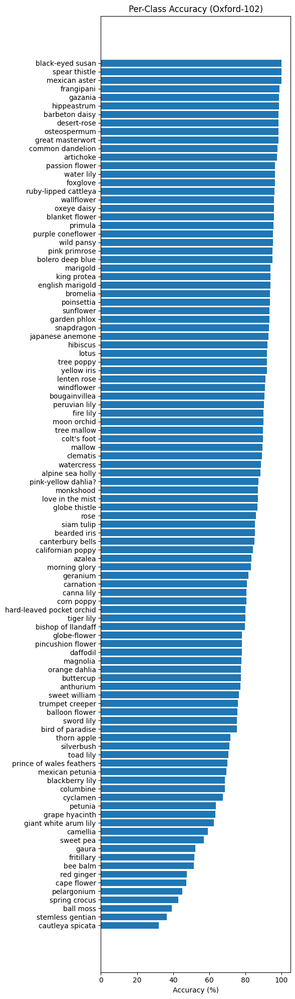

In [37]:
import matplotlib.pyplot as plt
from collections import defaultdict
import torch

# 1) Accumulate correct and total counts per class
class_correct = defaultdict(int)
class_total   = defaultdict(int)

model.eval()
with torch.no_grad():
    for imgs, lbls, _ in val_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs    = model(imgs)
        preds      = outputs.argmax(dim=1)

        for t, p in zip(lbls, preds):
            class_total[int(t)] += 1
            if int(t) == int(p):
                class_correct[int(t)] += 1

# 2) Build and sort an (name, accuracy %) list
acc_list = [
    (class_names[i], class_correct[i] / class_total[i] * 100)
    for i in class_total
]
acc_list.sort(key=lambda x: x[1], reverse=True)
names, accs = zip(*acc_list)

# 3) Plot horizontal bar chart
plt.figure(figsize=(6, 20))
y_pos = range(len(names))
plt.barh(y_pos, accs)
plt.yticks(y_pos, names)
plt.xlabel("Accuracy (%)")
plt.title("Per-Class Accuracy (Oxford-102)")
plt.gca().invert_yaxis()  # highest at top
plt.tight_layout()
plt.show()


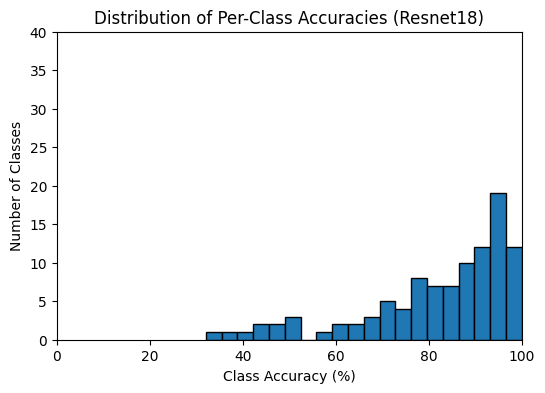

In [38]:
all_accs = [acc for _, acc in acc_list]
plt.figure(figsize=(6,4))
plt.hist(all_accs, bins=20, edgecolor='k')
plt.xlabel("Class Accuracy (%)")
plt.ylabel("Number of Classes")
plt.title("Distribution of Per-Class Accuracies (Resnet18)")
plt.ylim(0, 40)
plt.xlim(0,100)
plt.show()


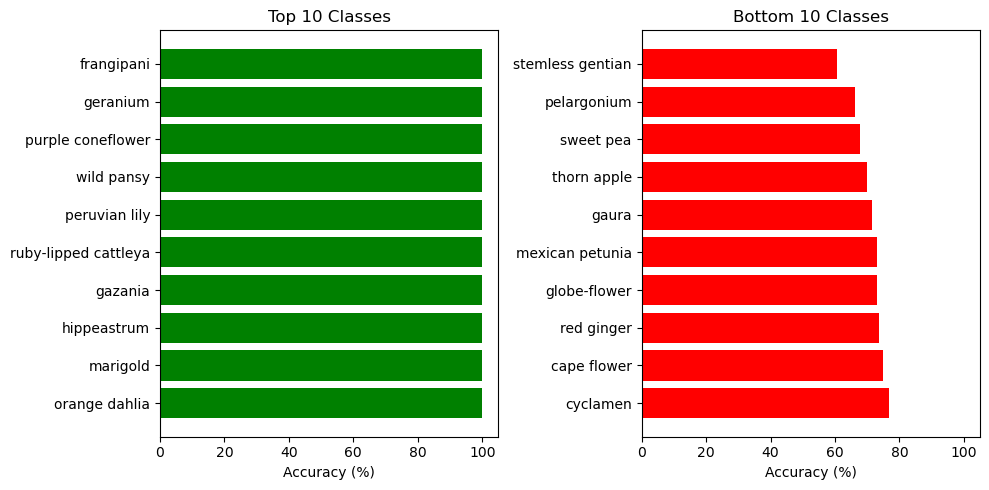

In [16]:
# after computing `acc_list` and sorting as before:

top_n    = acc_list[:10]
bottom_n = acc_list[-10:]

# unpack
top_names, top_accs     = zip(*top_n)
bot_names, bot_accs     = zip(*bottom_n)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5), sharex=True)
# Top 10
ax1.barh(top_names[::-1], top_accs[::-1], color='green')
ax1.set_title("Top 10 Classes")
ax1.set_xlabel("Accuracy (%)")
# Bottom 10
ax2.barh(bot_names, bot_accs, color='red')
ax2.set_title("Bottom 10 Classes")
ax2.set_xlabel("Accuracy (%)")

plt.tight_layout()
plt.show()


d:\Downloads\ANACONDA\lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


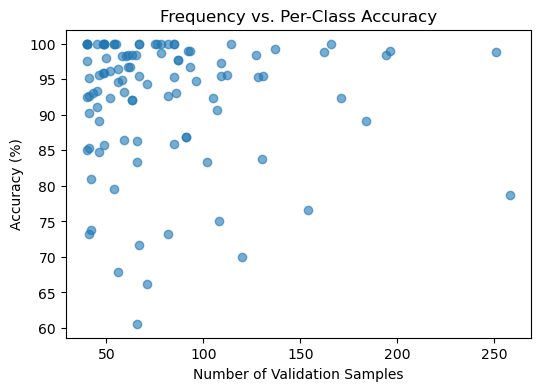

In [17]:
# compute class counts
counts = defaultdict(int)
for _, lbls, _ in val_loader:
    for t in lbls:
        counts[int(t)] += 1

# build (count, accuracy) pairs
freq_acc = [(counts[i], class_correct[i]/class_total[i]*100) 
            for i in class_total]
counts_list, accs_list = zip(*freq_acc)

# scatter plot
plt.figure(figsize=(6,4))
plt.scatter(counts_list, accs_list, alpha=0.6)
plt.xlabel("Number of Validation Samples")
plt.ylabel("Accuracy (%)")
plt.title("Frequency vs. Per-Class Accuracy")
plt.show()


In [18]:
import numpy as np

# Build a full confusion matrix
num_classes = len(class_names)
cm = np.zeros((num_classes, num_classes), dtype=int)
model.eval()
with torch.no_grad():
    for imgs, lbls, _ in val_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        preds      = model(imgs).argmax(dim=1)
        for t,p in zip(lbls, preds):
            cm[int(t), int(p)] += 1

# For the bottom‐k classes, show their top‐3 confusions:
bottom_idxs = [i for _,i in sorted([(class_correct[i]/class_total[i],i) 
                                   for i in class_total])][:5]
for i in bottom_idxs:
    conf_idxs = np.argsort(cm[i])[::-1][1:4]
    print(f"\n'{class_names[i]}' mis→", 
          ", ".join(f"{class_names[j]} ({cm[i,j]})" for j in conf_idxs))



'stemless gentian' mis→ globe thistle (9), love in the mist (8), great masterwort (6)

'pelargonium' mis→ pink primrose (7), bougainvillea (6), lenten rose (3)

'sweet pea' mis→ lenten rose (2), anthurium (2), columbine (2)

'thorn apple' mis→ poinsettia (13), love in the mist (8), sword lily (4)

'gaura' mis→ carnation (10), lenten rose (3), peruvian lily (2)


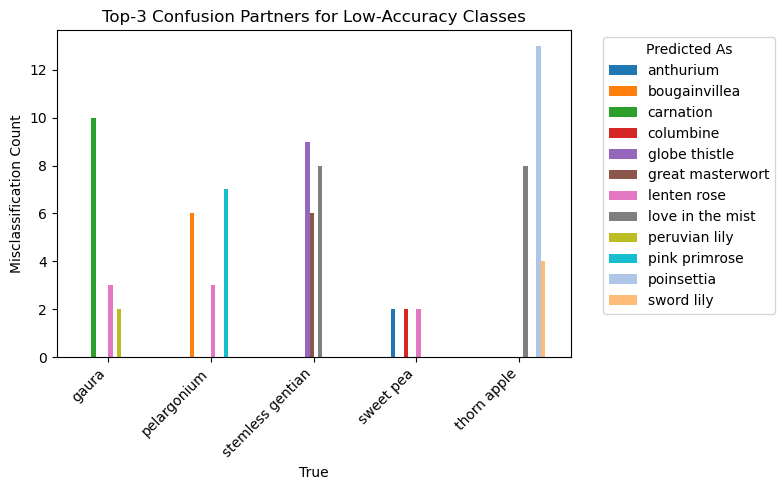

In [33]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Your confusion‐pair data
data = {
    'stemless gentian': [('globe thistle', 9), ('love in the mist', 8), ('great masterwort', 6)],
    'pelargonium':      [('pink primrose', 7), ('bougainvillea', 6), ('lenten rose', 3)],
    'sweet pea':        [('lenten rose', 2), ('anthurium', 2), ('columbine', 2)],
    'thorn apple':      [('poinsettia', 13), ('love in the mist', 8), ('sword lily', 4)],
    'gaura':            [('carnation', 10), ('lenten rose', 3), ('peruvian lily', 2)],
}

# Build a DataFrame
rows = []
for true_class, confs in data.items():
    for pred_class, count in confs:
        rows.append({'True': true_class, 'Predicted': pred_class, 'Count': count})
df = pd.DataFrame(rows)

# Pivot for plotting
df_pivot = df.pivot(index='True', columns='Predicted', values='Count').fillna(0)

# Define colors and select as many as needed
colors = [
    "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728",
    "#9467bd", "#8c564b", "#e377c2", "#7f7f7f",
    "#bcbd22", "#17becf", "#aec7e8", "#ffbb78"
]
n_bars = df_pivot.shape[1]
bar_colors = colors[:n_bars]

# Plot with custom colors
ax = df_pivot.plot(
    kind='bar', 
    figsize=(8, 5),
    color=bar_colors
)
ax.set_ylabel("Misclassification Count")
ax.set_title("Top-3 Confusion Partners for Low-Accuracy Classes")
ax.legend(title="Predicted As", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


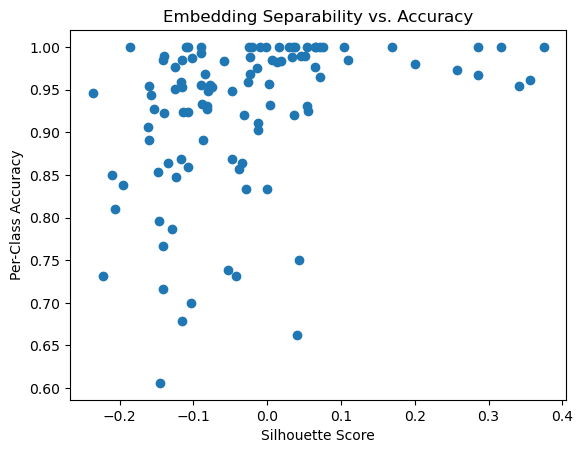

In [19]:
from sklearn.metrics import silhouette_samples
from torch import nn

# 1) Hook to capture embeddings
features = []
labels   = []
def hook(module, inp, out): 
    features.append(out.flatten(1).cpu().numpy())

model.avg_pool.register_forward_hook(hook)

# 2) Run all validation images through model
model.eval()
with torch.no_grad():
    for imgs, lbls, _ in val_loader:
        hook_feats = []  # reset per batch
        _ = model(imgs.to(device))
        features  += hook_feats
        labels    += lbls.cpu().numpy().tolist()

# 3) Silhouette per sample, then average per class
embs = np.vstack(features)
samps = silhouette_samples(embs, labels)
class_sil = {i: np.mean([s for s,l in zip(samps,labels) if l==i])
             for i in set(labels)}

# 4) Correlate silhouette vs. accuracy
import matplotlib.pyplot as plt
accs = [class_correct[i]/class_total[i] for i in class_sil]
sils = [class_sil[i]              for i in class_sil]
plt.scatter(sils, accs)
plt.xlabel("Silhouette Score")
plt.ylabel("Per-Class Accuracy")
plt.title("Embedding Separability vs. Accuracy")
plt.show()


In [22]:

import os
import torch
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms


class_names = [
    'pink primrose', 'hard-leaved pocket orchid', 'canterbury bells', 'sweet pea',
    'english marigold', 'tiger lily', 'moon orchid', 'bird of paradise', 'monkshood',
    'globe thistle', 'snapdragon', "colt's foot", 'king protea', 'spear thistle',
    'yellow iris', 'globe‑flower', 'purple coneflower', 'peruvian lily', 'balloon flower',
    'giant white arum lily', 'fire lily', 'pincushion flower', 'fritillary',
    'red ginger', 'grape hyacinth', 'corn poppy', 'prince of wales feathers',
    'stemless gentian', 'artichoke', 'sweet william', 'carnation', 'garden phlox',
    'love in the mist', 'mexican aster', 'alpine sea holly', 'ruby‑lipped cattleya',
    'cape flower', 'great masterwort', 'siam tulip', 'lenten rose', 'barbeton daisy',
    'daffodil', 'sword lily', 'poinsettia', 'bolero deep blue', 'wallflower',
    'marigold', 'buttercup', 'oxeye daisy', 'common dandelion', 'petunia',
    'wild pansy', 'primula', 'sunflower', 'pelargonium', 'bishop of llandaff',
    'gaura', 'geranium', 'orange dahlia', 'pink‑yellow dahlia?', 'cautleya spicata',
    'japanese anemone', 'black‑eyed susan', 'silverbush', 'californian poppy',
    'osteospermum', 'spring crocus', 'bearded iris', 'windflower', 'tree poppy',
    'gazania', 'azalea', 'water lily', 'rose', 'thorn apple', 'morning glory',
    'passion flower', 'lotus', 'toad lily', 'anthurium', 'frangipani', 'clematis',
    'hibiscus', 'columbine', 'desert‑rose', 'tree mallow', 'magnolia', 'cyclamen',
    'watercress', 'canna lily', 'hippeastrum', 'bee balm', 'ball moss',
    'foxglove', 'bougainvillea', 'camellia', 'mallow', 'mexican petunia',
    'bromelia', 'blanket flower', 'trumpet creeper', 'blackberry lily'
]

# 1) Dataset
class Oxford102Dataset(Dataset):
    def __init__(self, images_dir, mat_path, transform=None):
        self.images_dir = images_dir
        self.transform = transform
        mat = scipy.io.loadmat(mat_path)
        labels = mat['labels'].reshape(-1) - 1      # zero‐based
        self.labels = labels.astype(int)
        self.fnames = sorted(f for f in os.listdir(images_dir)
                             if f.lower().endswith('.jpg'))
        assert len(self.fnames) == len(self.labels)

    def __len__(self):
        return len(self.fnames)

    def __getitem__(self, idx):
        fn = self.fnames[idx]
        img = Image.open(os.path.join(self.images_dir, fn)).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img, self.labels[idx], fn

# 2) Transform & load
val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([.485,.456,.406], [.229,.224,.225]),
])
dataset = Oxford102Dataset(
    images_dir=r"D:\Downloads\102flowers\jpg",
    mat_path   =r"D:\Downloads\imagelabels.mat",
    transform  = val_tfms
)

# # 3) Pick one sample per class
# sample_idxs = {}
# for idx, (_, lbl, _) in enumerate(dataset):
#     if lbl not in sample_idxs:
#         sample_idxs[lbl] = idx
#     if len(sample_idxs) == len(class_names):
#         break

# # 4) Plot grid
# cols = 10
# rows = int(np.ceil(len(class_names)/cols))
# plt.figure(figsize=(cols*2, rows*2))
# for i, (lbl, idx) in enumerate(sample_idxs.items()):
#     img, _, _ = dataset[idx]
#     # un-normalize
#     img_np = img.permute(1,2,0).numpy()
#     img_np = np.clip(img_np * np.array([.229,.224,.225]) + 
#                      np.array([.485,.456,.406]), 0, 1)
#     ax = plt.subplot(rows, cols, i+1)
#     ax.imshow(img_np)
#     ax.axis('off')
#     ax.set_title(class_names[lbl], fontsize=6)
# plt.tight_layout()
# plt.show()



In [12]:
import os
import torch
import torch.nn.functional as F
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import re

# ---------------------------------------------------------------------------- #
# 0) Configuration
# ---------------------------------------------------------------------------- #
DEVICE     = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
DATA_DIR   = r"D:\Downloads\valid_dataset_google"   # your subset folder
CHECKPOINT = r"D:\Downloads\best_model.pth"         # your trained 102-class model

# ---------------------------------------------------------------------------- #
# 1) Transforms & DataLoader
# ---------------------------------------------------------------------------- #
val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[.485, .456, .406],
                         std=[.229, .224, .225]),
])
val_ds = ImageFolder(root=DATA_DIR, transform=val_tfms)
val_loader = DataLoader(val_ds, batch_size=32, shuffle=False, num_workers=0)

# ---------------------------------------------------------------------------- #
# 2) Full 102-class list (must match training order)
# ---------------------------------------------------------------------------- #
full_class_names = [
    'pink primrose', 'hard-leaved pocket orchid', 'canterbury bells', 'sweet pea',
    'english marigold', 'tiger lily', 'moon orchid', 'bird of paradise', 'monkshood',
    'globe thistle', 'snapdragon', "colt's foot", 'king protea', 'spear thistle',
    'yellow iris', 'globe‑flower', 'purple coneflower', 'peruvian lily', 'balloon flower',
    'giant white arum lily', 'fire lily', 'pincushion flower', 'fritillary',
    'red ginger', 'grape hyacinth', 'corn poppy', 'prince of wales feathers',
    'stemless gentian', 'artichoke', 'sweet william', 'carnation', 'garden phlox',
    'love in the mist', 'mexican aster', 'alpine sea holly', 'ruby‑lipped cattleya',
    'cape flower', 'great masterwort', 'siam tulip', 'lenten rose', 'barbeton daisy',
    'daffodil', 'sword lily', 'poinsettia', 'bolero deep blue', 'wallflower',
    'marigold', 'buttercup', 'oxeye daisy', 'common dandelion', 'petunia',
    'wild pansy', 'primula', 'sunflower', 'pelargonium', 'bishop of llandaff',
    'gaura', 'geranium', 'orange dahlia', 'pink‑yellow dahlia?', 'cautleya spicata',
    'japanese anemone', 'black‑eyed susan', 'silverbush', 'californian poppy',
    'osteospermum', 'spring crocus', 'bearded iris', 'windflower', 'tree poppy',
    'gazania', 'azalea', 'water lily', 'rose', 'thorn apple', 'morning glory',
    'passion flower', 'lotus', 'toad lily', 'anthurium', 'frangipani', 'clematis',
    'hibiscus', 'columbine', 'desert‑rose', 'tree mallow', 'magnolia', 'cyclamen',
    'watercress', 'canna lily', 'hippeastrum', 'bee balm', 'ball moss',
    'foxglove', 'bougainvillea', 'camellia', 'mallow', 'mexican petunia',
    'bromelia', 'blanket flower', 'trumpet creeper', 'blackberry lily'
]


# ---------------------------------------------------------------------------- #
# 3) Build map from subset folder-index → original 0–101 index using normalization
# ---------------------------------------------------------------------------- #
def normalize(name):
    name = name.lower().replace('_', ' ')
    name = re.sub(r'[^a-z0-9 ]+', ' ', name)
    return re.sub(r'\s+', ' ', name).strip()

# Map normalized raw names to their original indices
raw_to_idx = { normalize(raw): i for i, raw in enumerate(full_class_names) }

# Create orig_map for each folder in the subset
orig_map = {}
for i, folder_name in enumerate(val_ds.classes):
    norm = normalize(folder_name)
    if norm not in raw_to_idx:
        raise KeyError(f"Cannot map subset folder '{folder_name}' (normalized '{norm}') back to full classes")
    orig_map[i] = raw_to_idx[norm]

# ---------------------------------------------------------------------------- #
# 4) Load your model
# ---------------------------------------------------------------------------- #

model = FlowerCNN(num_classes=102).to(DEVICE)
state = torch.load(CHECKPOINT, map_location=DEVICE)
model.load_state_dict(state)
model.eval()

# ---------------------------------------------------------------------------- #
# 5) Validation loop
# ---------------------------------------------------------------------------- #
correct = total = 0
for imgs, lbls in val_loader:
    imgs = imgs.to(DEVICE)
    orig_lbls = torch.tensor([orig_map[int(x)] for x in lbls], device=DEVICE)
    with torch.no_grad():
        preds = model(imgs).argmax(dim=1)
    correct += (preds == orig_lbls).sum().item()
    total   += orig_lbls.size(0)

print(f"Validation accuracy on subset: {100 * correct/total:.2f}% ({correct}/{total})")


C:\Users\User\AppData\Local\Temp\ipykernel_23204\618504715.py:81: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(CHECKPOINT, map_location=DEVICE)


Validation accuracy on subset: 89.80% (458/510)


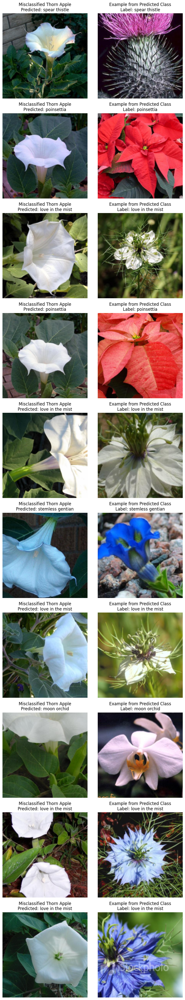

In [23]:
import random
import os
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import DataLoader
from torchvision import transforms

# ─── 1. SETUP: Oxford102Dataset & Model ───────────────────────────────────────
# (Assumes Oxford102Dataset, class_names, and model are already defined in your environment.)

# Path to Oxford 102 images and labels .mat file
images_dir = r"D:\Downloads\102flowers\jpg"
mat_path    = r"D:\Downloads\imagelabels.mat"

# Create the validation dataset (no normalization here, since we’ll apply it at inference time)
val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([.485, .456, .406], [.229, .224, .225])
])
val_ds = Oxford102Dataset(images_dir=images_dir, mat_path=mat_path, transform=val_tfms)

# Full list of 102 class names (must match the order used during training)
full_class_names = class_names  # from your snippet above

# Load your trained FlowerCNN model (assumes model and checkpoint loading done elsewhere)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()
model.to(device)

# ─── 2. DATA LOADER & MAPPING ─────────────────────────────────────────────────
batch_size = 32
val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=0)

# Build a reverse‐mapping: full-class index → list of dataset indices in val_ds
fullidx_to_ds = {}
for ds_idx, (_, lbl, _) in enumerate(val_ds):
    fullidx_to_ds.setdefault(lbl, []).append(ds_idx)

# ─── 3. COLLECT ALL MISCLASSIFICATIONS ───────────────────────────────────────
incorrect_samples = []
display_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()
])

global_idx = 0
with torch.no_grad():
    for images, true_labels, _ in val_loader:
        images = images.to(device)
        logits = model(images)  # shape [B, 102]

        for i in range(images.size(0)):
            pred_idx = int(logits[i].argmax().item())
            true_idx = int(true_labels[i].item())

            if pred_idx != true_idx:
                # Store (dataset index, true class, logits) for plotting later
                incorrect_samples.append((global_idx, true_idx, logits[i].cpu()))
            global_idx += 1

# ─── 4. FILTER FOR “Thorn Apple” MISCLASSIFICATIONS ────────────────────────────
# Find index of “thorn apple” in full_class_names (case-insensitive)
thorn_apple_idx = next(
    idx for idx, name in enumerate(full_class_names)
    if name.lower() == "thorn apple"
)

thorn_apple_mis = [
    (ds_idx, true_idx, logits)
    for (ds_idx, true_idx, logits) in incorrect_samples
    if true_idx == thorn_apple_idx
]

if not thorn_apple_mis:
    raise RuntimeError("No misclassified 'Thorn Apple' samples found.")

# Sample up to 10 misclassified Thorn Apple examples
mis_samples = random.sample(thorn_apple_mis, min(10, len(thorn_apple_mis)))

# ─── 5. PLOT THE MISCLASSIFICATIONS ──────────────────────────────────────────
num_rows = len(mis_samples)
fig, axes = plt.subplots(num_rows, 2, figsize=(8, 4 * num_rows))

for row, (ds_idx, true_idx, logits) in enumerate(mis_samples):
    pred_idx = int(logits.argmax().item())
    pred_name = full_class_names[pred_idx]

    # a) Load the misclassified Thorn Apple image (raw) for display
    fname = val_ds.fnames[ds_idx]
    input_path = os.path.join(images_dir, fname)
    input_img = Image.open(input_path).convert("RGB")
    input_tensor = display_tfms(input_img)
    input_np = input_tensor.numpy().transpose(1, 2, 0)

    # b) Pick a random example from the predicted class
    rep_idx = random.choice(fullidx_to_ds[pred_idx])
    rep_fname = val_ds.fnames[rep_idx]
    rep_path = os.path.join(images_dir, rep_fname)
    rep_img = Image.open(rep_path).convert("RGB")
    rep_tensor = display_tfms(rep_img)
    rep_np = rep_tensor.numpy().transpose(1, 2, 0)

    # c) Handle single-row vs. multi-row axes unpacking
    if num_rows == 1:
        ax1, ax2 = axes
    else:
        ax1, ax2 = axes[row]

    ax1.imshow(input_np)
    ax1.set_title(f"Misclassified Thorn Apple\nPredicted: {pred_name}")
    ax1.axis("off")

    ax2.imshow(rep_np)
    ax2.set_title(f"Example from Predicted Class\nLabel: {pred_name}")
    ax2.axis("off")

plt.tight_layout()
plt.show()


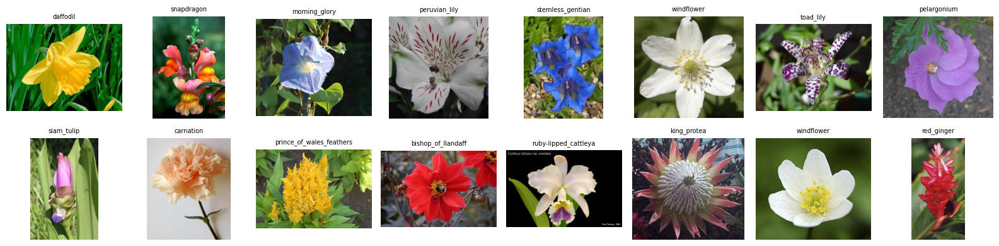

In [54]:
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# 1) Parameters
num_samples = 16
cols = 8
rows = int(np.ceil(num_samples / cols))

# 2) Randomly sample from val_ds
all_samples = val_ds.samples  # list of (path, class_idx)
samples = random.sample(all_samples, num_samples)

# 3) Plot grid with un-normalization
fig, axes = plt.subplots(rows, cols, figsize=(cols*2, rows*2))
axes = axes.flatten()

mean = np.array([.485, .456, .406])
std  = np.array([.229, .224, .225])

for ax, (img_path, lbl) in zip(axes, samples):
    # Load & convert
    img = Image.open(img_path).convert("RGB")
    img_np = np.array(img).astype(np.float32) / 255.0
    ax.imshow(img_np)
    ax.axis('off')
    ax.set_title(val_ds.classes[lbl], fontsize=7)

# Hide any extra axes
for ax in axes[num_samples:]:
    ax.axis('off')

plt.tight_layout()
plt.show()


In [19]:
import os
import re
import torch
import torch.nn.functional as F
from PIL import Image
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from pathlib import Path

# ---------------------------------------------------------------------------- #
# 0) Configuration
# ---------------------------------------------------------------------------- #
DEVICE     = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
DATA_DIR   = r"D:\Downloads\showcase_image"  # your folder with 3 subfolders
CHECKPOINT = r"D:\Downloads\best_model.pth"  # your trained 102-class model

# ---------------------------------------------------------------------------- #
# 1) Transforms
# ---------------------------------------------------------------------------- #
tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[.485, .456, .406],
                         std=[.229, .224, .225]),
])

# ---------------------------------------------------------------------------- #
# 2) Full 102-class list (must match training order)
# ---------------------------------------------------------------------------- #
full_class_names = [
    'pink primrose', 'hard-leaved pocket orchid', 'canterbury bells', 'sweet pea',
    'english marigold', 'tiger lily', 'moon orchid', 'bird of paradise', 'monkshood',
    'globe thistle', 'snapdragon', "colt's foot", 'king protea', 'spear thistle',
    'yellow iris', 'globe-flower', 'purple coneflower', 'peruvian lily', 'balloon flower',
    'giant white arum lily', 'fire lily', 'pincushion flower', 'fritillary',
    'red ginger', 'grape hyacinth', 'corn poppy', 'prince of wales feathers',
    'stemless gentian', 'artichoke', 'sweet william', 'carnation', 'garden phlox',
    'love in the mist', 'mexican aster', 'alpine sea holly', 'ruby-lipped cattleya',
    'cape flower', 'great masterwort', 'siam tulip', 'lenten rose', 'barbeton daisy',
    'daffodil', 'sword lily', 'poinsettia', 'bolero deep blue', 'wallflower',
    'marigold', 'buttercup', 'oxeye daisy', 'common dandelion', 'petunia',
    'wild pansy', 'primula', 'sunflower', 'pelargonium', 'bishop of llandaff',
    'gaura', 'geranium', 'orange dahlia', 'pink-yellow dahlia?', 'cautleya spicata',
    'japanese anemone', 'black-eyed susan', 'silverbush', 'californian poppy',
    'osteospermum', 'spring crocus', 'bearded iris', 'windflower', 'tree poppy',
    'gazania', 'azalea', 'water lily', 'rose', 'thorn apple', 'morning glory',
    'passion flower', 'lotus', 'toad lily', 'anthurium', 'frangipani', 'clematis',
    'hibiscus', 'columbine', 'desert-rose', 'tree mallow', 'magnolia', 'cyclamen',
    'watercress', 'canna lily', 'hippeastrum', 'bee balm', 'ball moss',
    'foxglove', 'bougainvillea', 'camellia', 'mallow', 'mexican petunia',
    'bromelia', 'blanket flower', 'trumpet creeper', 'blackberry lily'
]

# ---------------------------------------------------------------------------- #
# 3) Build mapping from folder-name → full-class index
# ---------------------------------------------------------------------------- #
def normalize(name):
    name = name.lower().replace('_', ' ')
    name = re.sub(r'[^a-z0-9 ]+', ' ', name)
    return re.sub(r'\s+', ' ', name).strip()

raw_to_idx = { normalize(c): i for i, c in enumerate(full_class_names) }

# ---------------------------------------------------------------------------- #
# 4) Custom inference dataset that also returns file paths
# ---------------------------------------------------------------------------- #
class InferenceFolder(Dataset):
    def __init__(self, root, transform):
        self.transform = transform
        self.samples = []
        # expect subfolders = class names
        for cls_name in os.listdir(root):
            cls_path = os.path.join(root, cls_name)
            if not os.path.isdir(cls_path):
                continue
            norm = normalize(cls_name)
            if norm not in raw_to_idx:
                raise KeyError(f"Unknown folder '{cls_name}'")
            label = raw_to_idx[norm]
            for fn in os.listdir(cls_path):
                if fn.lower().endswith(('.jpg','.png','.jpeg','bmp')):
                    self.samples.append((os.path.join(cls_path,fn), label))
    def __len__(self):
        return len(self.samples)
    def __getitem__(self, idx):
        path, label = self.samples[idx]
        img = Image.open(path).convert("RGB")
        return self.transform(img), label, path

# ---------------------------------------------------------------------------- #
# 5) DataLoader
# ---------------------------------------------------------------------------- #
inf_ds = InferenceFolder(DATA_DIR, tfms)
inf_loader = DataLoader(inf_ds, batch_size=1, shuffle=False)

# ---------------------------------------------------------------------------- #
# 6) Load your model
# ---------------------------------------------------------------------------- #
model = FlowerCNN(num_classes=102).to(DEVICE)
state = torch.load(CHECKPOINT, map_location=DEVICE)
model.load_state_dict(state)
model.eval()

from pathlib import Path
import torch.nn.functional as F

# ---------------------------------------------------------------------------- #
# 7) Inference & print TOP-5 predictions for each image
# ---------------------------------------------------------------------------- #
with torch.no_grad():
    for img_batch, _, path_batch in inf_loader:
        # Extract the single image path
        img_path = path_batch[0]
        filename = Path(img_path).name

        # Forward pass
        img = img_batch.to(DEVICE)
        logits = model(img)
        probs  = F.softmax(logits, dim=1)[0]

        # Top-5
        top5_prob, top5_idx = probs.topk(5)

        # Print results
        print(f"{filename}:")
        for rank, (idx, prob) in enumerate(zip(top5_idx, top5_prob), start=1):
            cls_name = full_class_names[int(idx)]
            print(f"  {rank}. {cls_name} ({prob.item()*100:.1f}%)")
        print()



C:\Users\User\AppData\Local\Temp\ipykernel_23204\2807320960.py:101: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(CHECKPOINT, map_location=DEVICE)


image_02016.jpg:
  1. anthurium (32.2%)
  2. columbine (7.1%)
  3. lenten rose (6.8%)
  4. rose (5.8%)
  5. mallow (5.3%)

blurred.jpg:
  1. bougainvillea (90.1%)
  2. siam tulip (2.7%)
  3. pink primrose (1.4%)
  4. ruby-lipped cattleya (0.9%)
  5. snapdragon (0.8%)

blur_darken.jpg:
  1. bougainvillea (77.9%)
  2. primula (5.8%)
  3. morning glory (1.4%)
  4. bolero deep blue (1.1%)
  5. canterbury bells (1.0%)

blur_exposed.jpg:
  1. bougainvillea (43.9%)
  2. siam tulip (20.8%)
  3. snapdragon (6.7%)
  4. pink primrose (2.7%)
  5. desert-rose (1.7%)

darken.jpg:
  1. bougainvillea (43.9%)
  2. primula (8.6%)
  3. clematis (6.4%)
  4. passion flower (3.6%)
  5. lenten rose (3.3%)

exposed.jpg:
  1. bougainvillea (87.2%)
  2. pink primrose (3.3%)
  3. great masterwort (1.4%)
  4. love in the mist (0.7%)
  5. sweet william (0.6%)

multiple_flower.jpg:
  1. bougainvillea (73.9%)
  2. sword lily (4.9%)
  3. ruby-lipped cattleya (2.4%)
  4. snapdragon (1.9%)
  5. bolero deep blue (1.7%)


C:\Users\User\AppData\Local\Temp\ipykernel_7884\3098379379.py:106: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(CHECKPOINT, map_location=DEVICE)


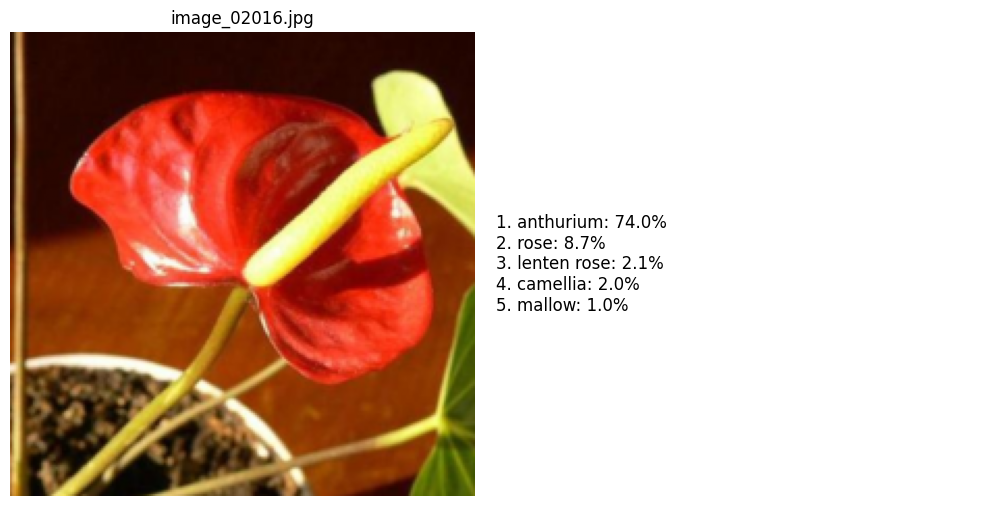

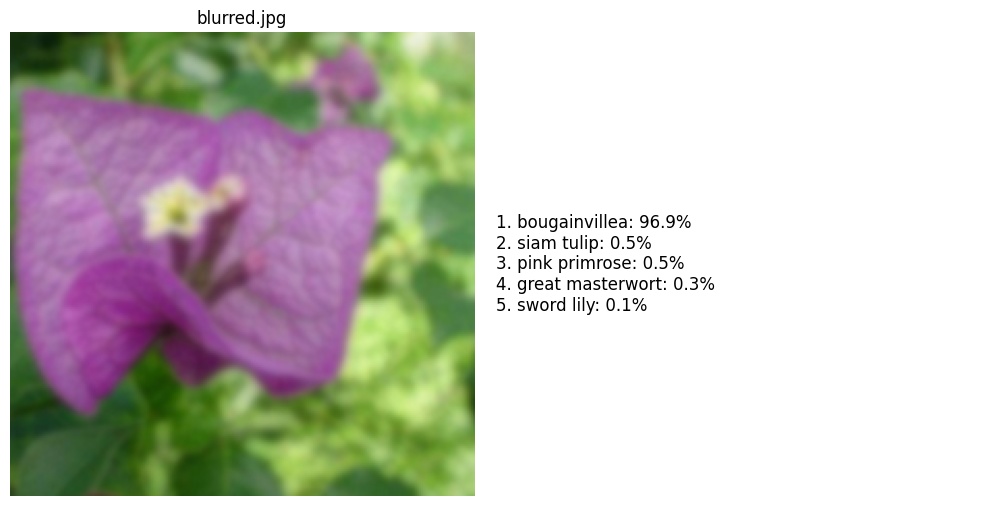

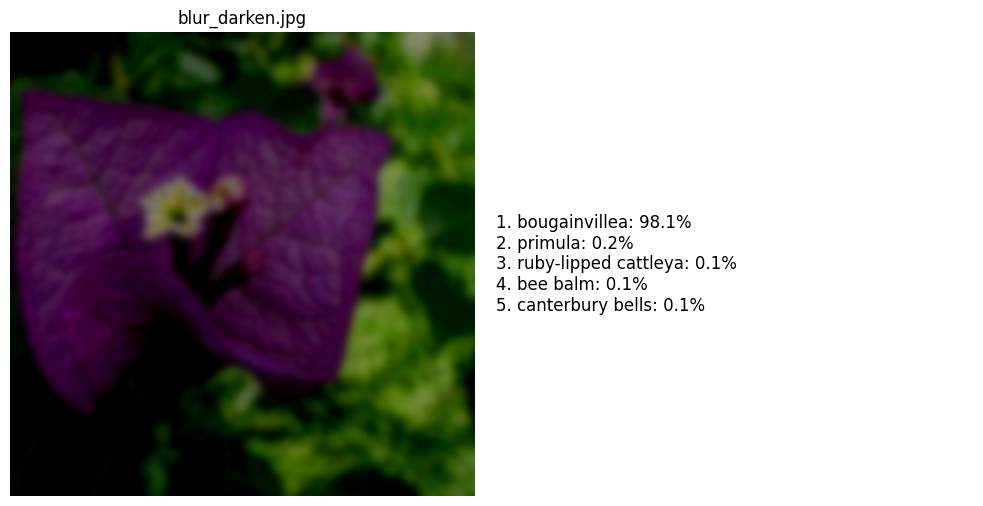

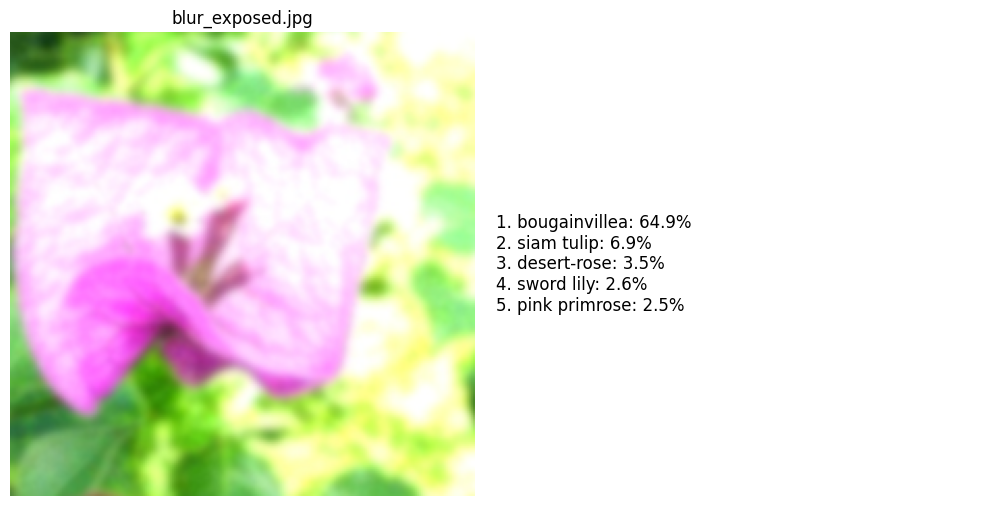

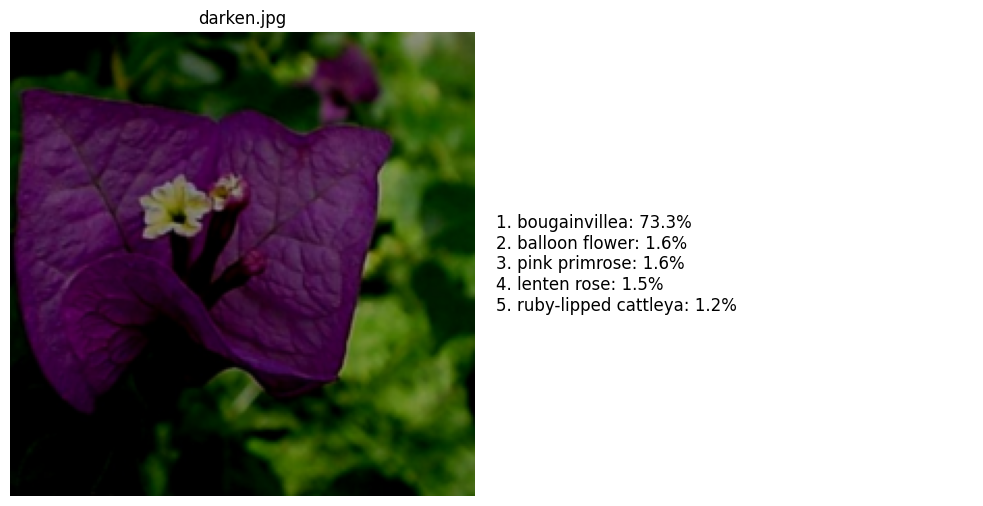

...

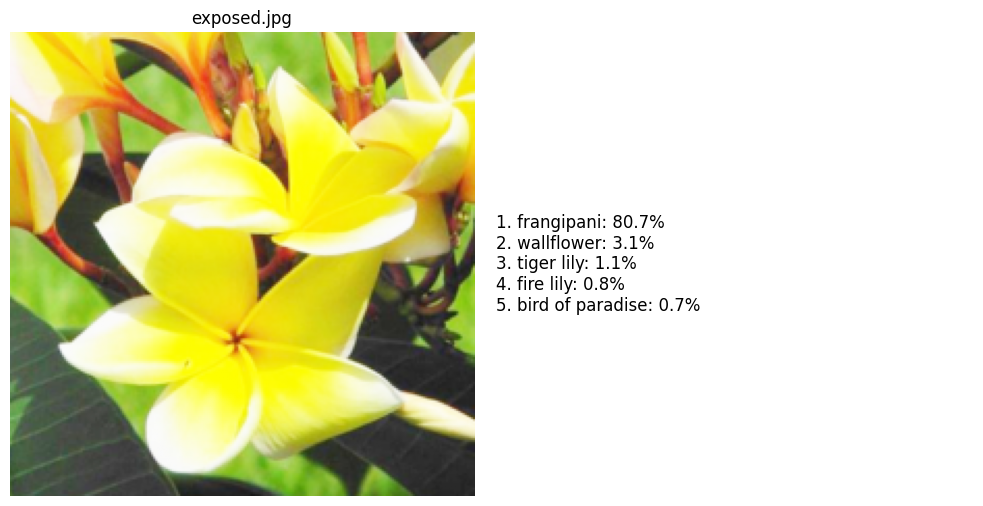

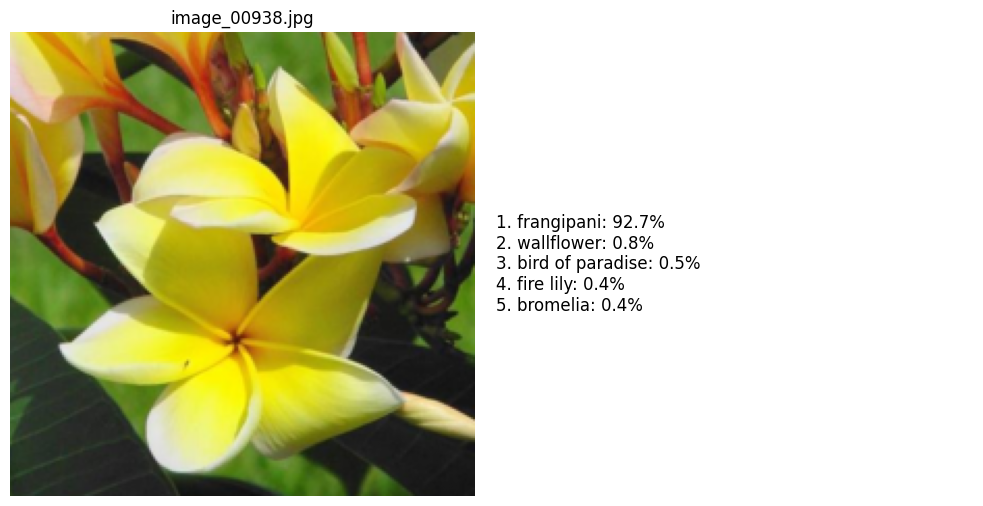

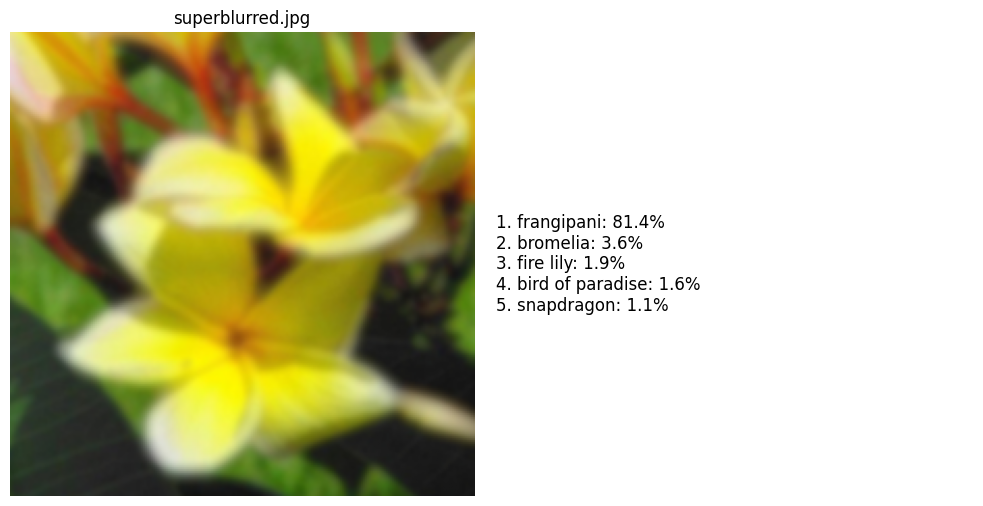

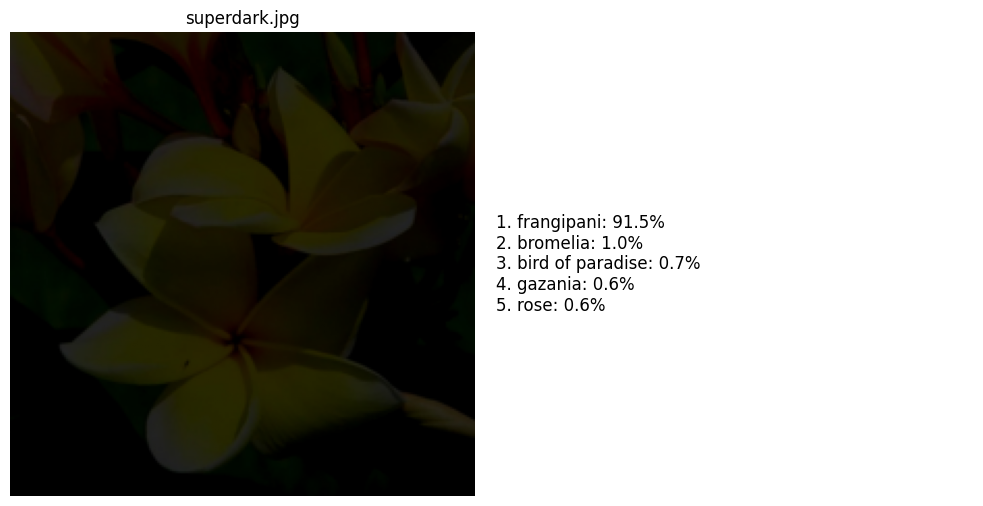

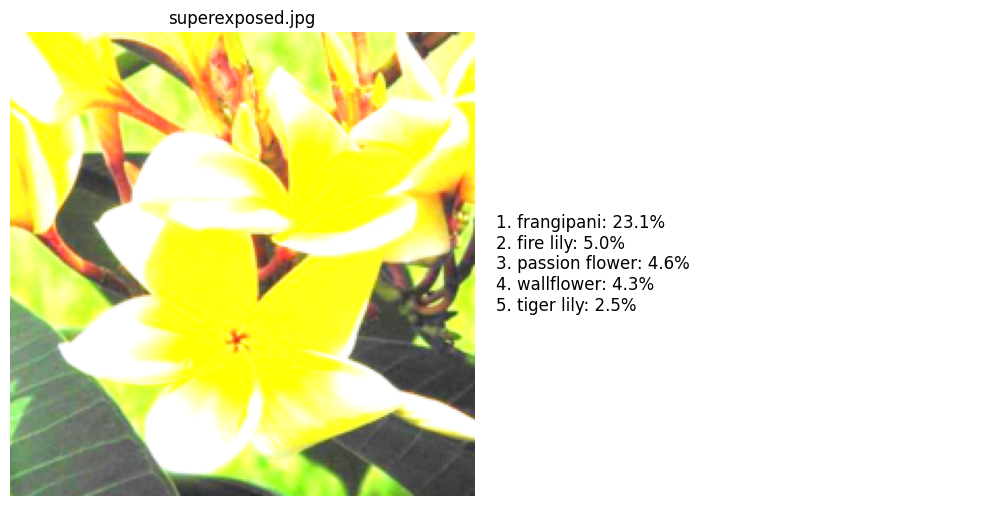

In [22]:
import os
import re
import torch
import torch.nn.functional as F
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

# ---------------------------------------------------------------------------- #
# 0) Configuration
# ---------------------------------------------------------------------------- #
DEVICE     = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
DATA_DIR   = r"D:\Downloads\showcase_image"  # folder with subfolders: bougainvillea, frangipani, anthurium
CHECKPOINT = r"D:\Downloads\best_model.pth"  # your trained 102-class model

# ---------------------------------------------------------------------------- #
# 1) Transforms
# ---------------------------------------------------------------------------- #
tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[.485, .456, .406],
                         std=[.229, .224, .225]),
])
# for display (no normalization)
disp_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
])

# ---------------------------------------------------------------------------- #
# 2) Full 102-class list (must match training order)
# ---------------------------------------------------------------------------- #
full_class_names = [
    'pink primrose','hard-leaved pocket orchid','canterbury bells','sweet pea',
    'english marigold','tiger lily','moon orchid','bird of paradise','monkshood',
    'globe thistle','snapdragon',"colt's foot",'king protea','spear thistle',
    'yellow iris','globe-flower','purple coneflower','peruvian lily','balloon flower',
    'giant white arum lily','fire lily','pincushion flower','fritillary',
    'red ginger','grape hyacinth','corn poppy','prince of wales feathers',
    'stemless gentian','artichoke','sweet william','carnation','garden phlox',
    'love in the mist','mexican aster','alpine sea holly','ruby-lipped cattleya',
    'cape flower','great masterwort','siam tulip','lenten rose','barbeton daisy',
    'daffodil','sword lily','poinsettia','bolero deep blue','wallflower',
    'marigold','buttercup','oxeye daisy','common dandelion','petunia',
    'wild pansy','primula','sunflower','pelargonium','bishop of llandaff',
    'gaura','geranium','orange dahlia','pink-yellow dahlia?','cautleya spicata',
    'japanese anemone','black-eyed susan','silverbush','californian poppy',
    'osteospermum','spring crocus','bearded iris','windflower','tree poppy',
    'gazania','azalea','water lily','rose','thorn apple','morning glory',
    'passion flower','lotus','toad lily','anthurium','frangipani','clematis',
    'hibiscus','columbine','desert-rose','tree mallow','magnolia','cyclamen',
    'watercress','canna lily','hippeastrum','bee balm','ball moss',
    'foxglove','bougainvillea','camellia','mallow','mexican petunia',
    'bromelia','blanket flower','trumpet creeper','blackberry lily'
]

# ---------------------------------------------------------------------------- #
# 3) Build mapping from folder-name → full-class index
# ---------------------------------------------------------------------------- #
def normalize(name):
    name = name.lower().replace('_',' ')
    name = re.sub(r'[^a-z0-9 ]+',' ', name)
    return re.sub(r'\s+',' ', name).strip()

raw_to_idx = { normalize(c): i for i, c in enumerate(full_class_names) }

# ---------------------------------------------------------------------------- #
# 4) Inference dataset returning img, label, path
# ---------------------------------------------------------------------------- #
class InferenceFolder(Dataset):
    def __init__(self, root, transform):
        self.transform = transform
        self.samples = []
        for cls_name in os.listdir(root):
            cls_path = os.path.join(root, cls_name)
            if not os.path.isdir(cls_path): continue
            norm = normalize(cls_name)
            if norm not in raw_to_idx:
                raise KeyError(f"Unknown folder '{cls_name}'")
            label = raw_to_idx[norm]
            for fn in os.listdir(cls_path):
                if fn.lower().endswith(('.jpg','.png','.jpeg','bmp')):
                    self.samples.append((os.path.join(cls_path, fn), label))
    def __len__(self):
        return len(self.samples)
    def __getitem__(self, idx):
        path, label = self.samples[idx]
        img = Image.open(path).convert("RGB")
        return self.transform(img), label, path

# ---------------------------------------------------------------------------- #
# 5) DataLoader
# ---------------------------------------------------------------------------- #
inf_ds = InferenceFolder(DATA_DIR, tfms)
inf_loader = DataLoader(inf_ds, batch_size=1, shuffle=False)

# ---------------------------------------------------------------------------- #
# 6) Load the model
# ---------------------------------------------------------------------------- #
model = FlowerCNN(num_classes=102).to(DEVICE)
state = torch.load(CHECKPOINT, map_location=DEVICE)
model.load_state_dict(state)
model.eval()

# ---------------------------------------------------------------------------- #
# 7) Inference + visualization
# ---------------------------------------------------------------------------- #
with torch.no_grad():
    for img_tensor, _, path_batch in inf_loader:
        path = path_batch[0]
        filename = Path(path).name

        # Predict
        img = img_tensor.to(DEVICE)
        logits = model(img)
        probs  = F.softmax(logits, dim=1)[0]
        top5_prob, top5_idx = probs.topk(5)

        # Prepare display image
        pil = Image.open(path).convert("RGB")
        disp = disp_tfms(pil)
        img_np = np.array(disp) / 255.0

        # Plot
        fig, (ax_img, ax_txt) = plt.subplots(1,2, figsize=(10,5))
        ax_img.imshow(img_np)
        ax_img.set_title(filename)
        ax_img.axis('off')

        ax_txt.axis('off')
        lines = [f"{i+1}. {full_class_names[idx]}: {prob*100:.1f}%"
                 for i,(idx,prob) in enumerate(zip(top5_idx, top5_prob))]
        ax_txt.text(0, 0.5, "\n".join(lines), va='center', fontsize=12)

        plt.tight_layout()
        plt.show()


C:\Users\User\AppData\Local\Temp\ipykernel_24760\2917342402.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(CHECKPOINT, map_location=DEVICE)


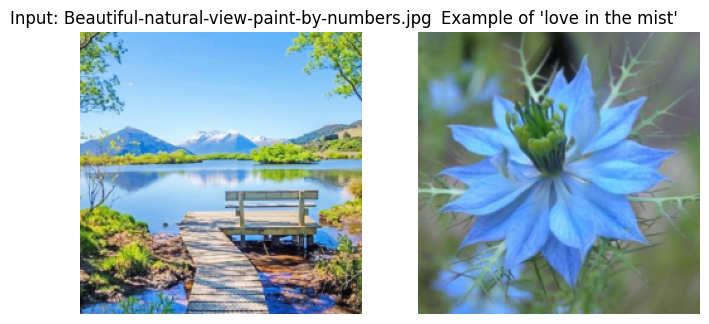

Top-5 for Beautiful-natural-view-paint-by-numbers.jpg:
  1. love in the mist (30.5%)
  2. windflower (8.9%)
  3. stemless gentian (5.3%)
  4. lenten rose (4.4%)
  5. king protea (4.0%)

----------------------------------------



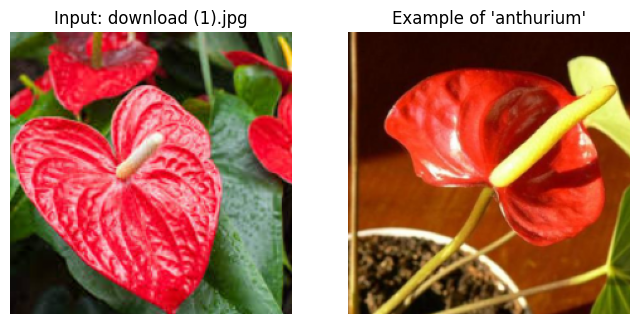

Top-5 for download (1).jpg:
  1. anthurium (44.6%)
  2. prince of wales feathers (5.8%)
  3. blackberry lily (4.9%)
  4. hippeastrum (4.2%)
  5. poinsettia (3.7%)

----------------------------------------



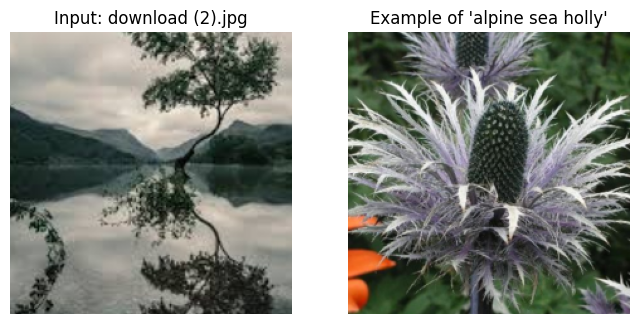

Top-5 for download (2).jpg:
  1. alpine sea holly (39.6%)
  2. great masterwort (11.6%)
  3. oxeye daisy (8.0%)
  4. foxglove (5.6%)
  5. globe thistle (2.0%)

----------------------------------------



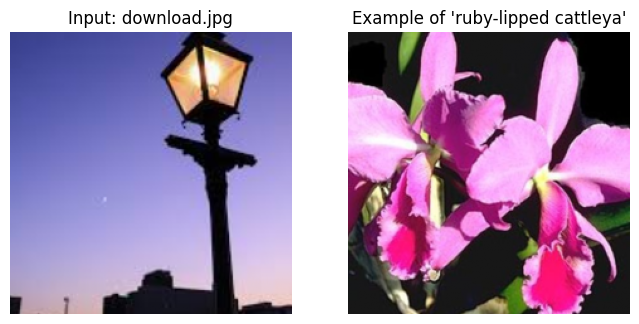

Top-5 for download.jpg:
  1. ruby-lipped cattleya (28.2%)
  2. bolero deep blue (20.3%)
  3. mexican petunia (4.4%)
  4. pelargonium (4.2%)
  5. pincushion flower (3.8%)

----------------------------------------



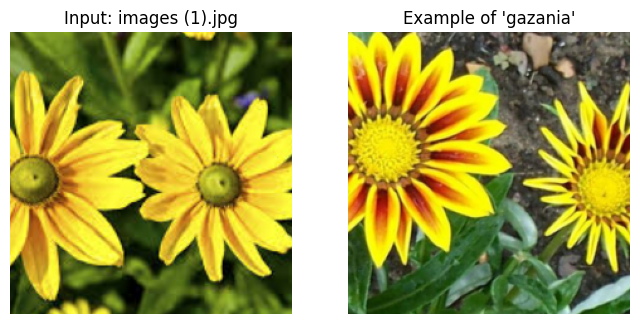

Top-5 for images (1).jpg:
  1. gazania (28.6%)
  2. primula (11.3%)
  3. sunflower (4.0%)
  4. colt's foot (3.9%)
  5. frangipani (3.0%)

----------------------------------------



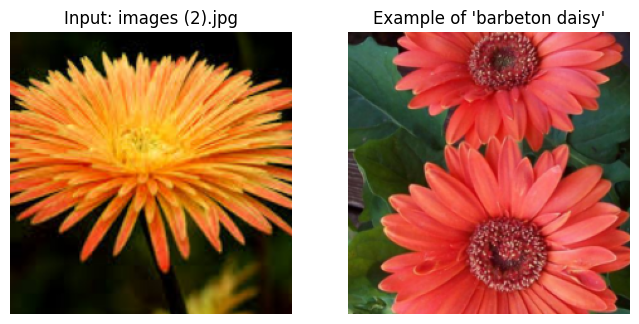

Top-5 for images (2).jpg:
  1. barbeton daisy (20.8%)
  2. common dandelion (15.8%)
  3. colt's foot (5.8%)
  4. orange dahlia (4.5%)
  5. pink-yellow dahlia? (4.0%)

----------------------------------------



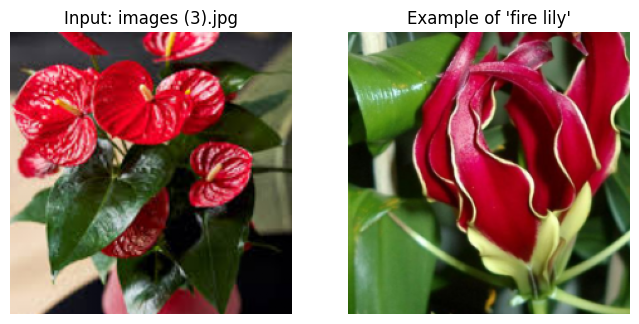

Top-5 for images (3).jpg:
  1. fire lily (18.2%)
  2. poinsettia (7.4%)
  3. blackberry lily (6.6%)
  4. hippeastrum (5.5%)
  5. bee balm (5.1%)

----------------------------------------



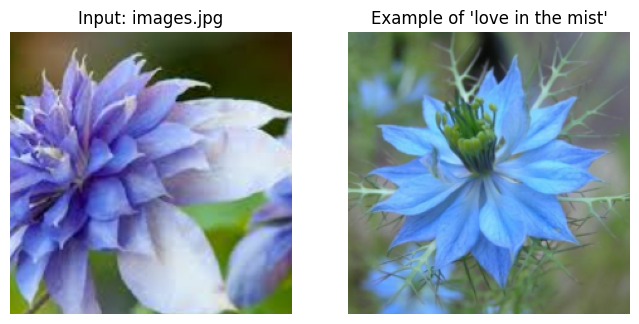

Top-5 for images.jpg:
  1. love in the mist (9.9%)
  2. frangipani (6.4%)
  3. bromelia (6.0%)
  4. globe thistle (5.8%)
  5. blackberry lily (4.5%)

----------------------------------------



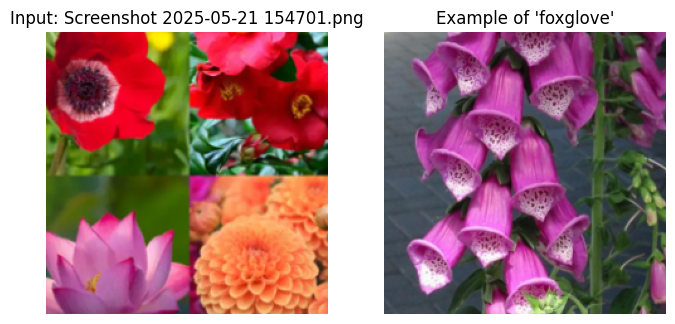

Top-5 for Screenshot 2025-05-21 154701.png:
  1. foxglove (11.5%)
  2. blanket flower (7.9%)
  3. corn poppy (4.1%)
  4. blackberry lily (3.3%)
  5. snapdragon (3.2%)

----------------------------------------



In [8]:
import os
import random
import torch
import torch.nn.functional as F
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

# ---------------------------------------------------------------------------- #
# 0) Configuration
# ---------------------------------------------------------------------------- #
DEVICE     = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
TEST_DIR   = r"D:\Downloads\test"             # folder with unlabeled images
CHECKPOINT = r"D:\Downloads\best_model.pth"    # your trained 102-class model

# ---------------------------------------------------------------------------- #
# 1) Transforms
# ---------------------------------------------------------------------------- #
tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[.485, .456, .406],
                         std=[.229, .224, .225]),
])
# for display (no normalization)
disp_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
])

# ---------------------------------------------------------------------------- #
# 2) Full 102-class list (must match training order)
# ---------------------------------------------------------------------------- #
full_class_names = [
    'pink primrose','hard-leaved pocket orchid','canterbury bells','sweet pea',
    'english marigold','tiger lily','moon orchid','bird of paradise','monkshood',
    'globe thistle','snapdragon',"colt's foot",'king protea','spear thistle',
    'yellow iris','globe-flower','purple coneflower','peruvian lily','balloon flower',
    'giant white arum lily','fire lily','pincushion flower','fritillary',
    'red ginger','grape hyacinth','corn poppy','prince of wales feathers',
    'stemless gentian','artichoke','sweet william','carnation','garden phlox',
    'love in the mist','mexican aster','alpine sea holly','ruby-lipped cattleya',
    'cape flower','great masterwort','siam tulip','lenten rose','barbeton daisy',
    'daffodil','sword lily','poinsettia','bolero deep blue','wallflower',
    'marigold','buttercup','oxeye daisy','common dandelion','petunia',
    'wild pansy','primula','sunflower','pelargonium','bishop of llandaff',
    'gaura','geranium','orange dahlia','pink-yellow dahlia?','cautleya spicata',
    'japanese anemone','black-eyed susan','silverbush','californian poppy',
    'osteospermum','spring crocus','bearded iris','windflower','tree poppy',
    'gazania','azalea','water lily','rose','thorn apple','morning glory',
    'passion flower','lotus','toad lily','anthurium','frangipani','clematis',
    'hibiscus','columbine','desert-rose','tree mallow','magnolia','cyclamen',
    'watercress','canna lily','hippeastrum','bee balm','ball moss',
    'foxglove','bougainvillea','camellia','mallow','mexican petunia',
    'bromelia','blanket flower','trumpet creeper','blackberry lily'
]

# ---------------------------------------------------------------------------- #
# 3) Load the trained model
# ---------------------------------------------------------------------------- #
model = FlowerCNN(num_classes=102).to(DEVICE)
state = torch.load(CHECKPOINT, map_location=DEVICE)
model.load_state_dict(state)
model.eval()

# ---------------------------------------------------------------------------- #
# 4) Prepare a mapping from each class index → list of sample file paths
#    (so we can show an example image for each predicted class)
# ---------------------------------------------------------------------------- #
# Assume you already have val_ds from your validation folder
fullidx_to_paths = {}
for path, folder_idx in val_ds.samples:
    full_idx = orig_map[folder_idx]
    fullidx_to_paths.setdefault(full_idx, []).append(path)

# ---------------------------------------------------------------------------- #
# 5) Dataset for unlabeled test images
# ---------------------------------------------------------------------------- #
class UnlabeledFolder(Dataset):
    def __init__(self, root, transform):
        self.transform = transform
        self.files = [
            os.path.join(root, fn)
            for fn in os.listdir(root)
            if fn.lower().endswith(('.jpg','.png','.jpeg','bmp'))
        ]
    def __len__(self):
        return len(self.files)
    def __getitem__(self, idx):
        path = self.files[idx]
        img  = Image.open(path).convert("RGB")
        return self.transform(img), path

test_ds = UnlabeledFolder(TEST_DIR, tfms)
test_loader = DataLoader(test_ds, batch_size=1, shuffle=False)

# ---------------------------------------------------------------------------- #
# 6) Inference & display top-5 + example image
# ---------------------------------------------------------------------------- #
with torch.no_grad():
    for img_tensor, path in test_loader:
        img_path = path[0]
        filename = Path(img_path).name

        # Forward pass
        img = img_tensor.to(DEVICE)
        logits = model(img)
        probs  = F.softmax(logits, dim=1)[0]
        top5_prob, top5_idx = probs.topk(5)

        # Load input and example images for display
        input_img = disp_tfms(Image.open(img_path).convert("RGB"))
        input_np  = np.array(input_img) / 255.0

        # Example from the top-1 predicted class
        pred_idx = int(top5_idx[0].item())
        example_path = random.choice(fullidx_to_paths[pred_idx])
        example_img = disp_tfms(Image.open(example_path).convert("RGB"))
        example_np  = np.array(example_img) / 255.0

        # Plot side by side
        fig, (ax_in, ax_ex) = plt.subplots(1, 2, figsize=(8,4))
        ax_in.imshow(input_np)
        ax_in.set_title(f"Input: {filename}")
        ax_in.axis('off')

        ax_ex.imshow(example_np)
        ax_ex.set_title(f"Example of '{full_class_names[pred_idx]}'")
        ax_ex.axis('off')
        plt.show()

        # Print top-5 predictions
        print(f"Top-5 for {filename}:")
        for i, (idx, prob) in enumerate(zip(top5_idx, top5_prob), start=1):
            name = full_class_names[int(idx)]
            print(f"  {i}. {name} ({prob.item()*100:.1f}%)")
        print("\n" + "-"*40 + "\n")


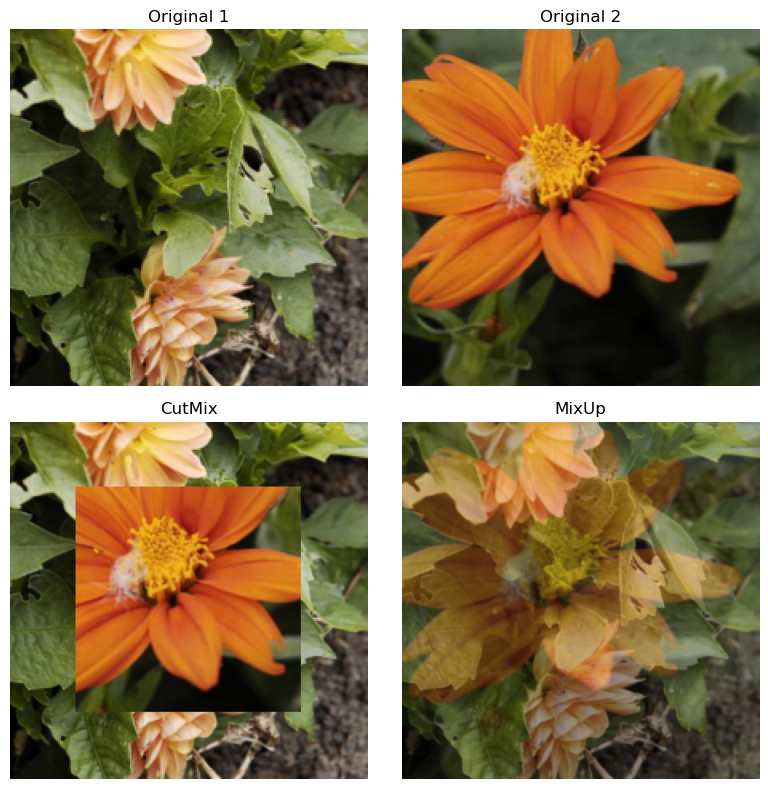

In [15]:
import random
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

# 1) Load the validation dataset (change DATA_DIR as needed)
DATA_DIR = r"D:\Downloads\valid_dataset_google"
val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
])
val_ds = datasets.ImageFolder(root=DATA_DIR, transform=val_tfms)

# 2) Sample two images
paths = random.sample([p for p, _ in val_ds.samples], 2)
imgs = [val_ds.loader(p).convert("RGB") for p in paths]
imgs = [val_tfms(img) for img in imgs]
imgs_np = [np.array(img)/255.0 for img in imgs]

# 3) Mixup
lam = 0.6
mixup_img = lam * imgs_np[0] + (1 - lam) * imgs_np[1]

# 4) CutMix
h, w, _ = imgs_np[0].shape
cut_h, cut_w = int(h * np.sqrt(1 - lam)), int(w * np.sqrt(1 - lam))
x1, y1 = (w - cut_w)//2, (h - cut_h)//2
x2, y2 = x1 + cut_w, y1 + cut_h
cutmix_img = imgs_np[0].copy()
cutmix_img[y1:y2, x1:x2] = imgs_np[1][y1:y2, x1:x2]

# 5) Plot

fig, axes = plt.subplots(2, 2, figsize=(8, 8))

# Top row: Originals
axes[0, 0].imshow(imgs_np[0])
axes[0, 0].set_title("Original 1")
axes[0, 0].axis('off')

axes[0, 1].imshow(imgs_np[1])
axes[0, 1].set_title("Original 2")
axes[0, 1].axis('off')

# Bottom row: CutMix and MixUp
axes[1, 0].imshow(cutmix_img)
axes[1, 0].set_title("CutMix")
axes[1, 0].axis('off')

axes[1, 1].imshow(mixup_img)
axes[1, 1].set_title("MixUp")
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()


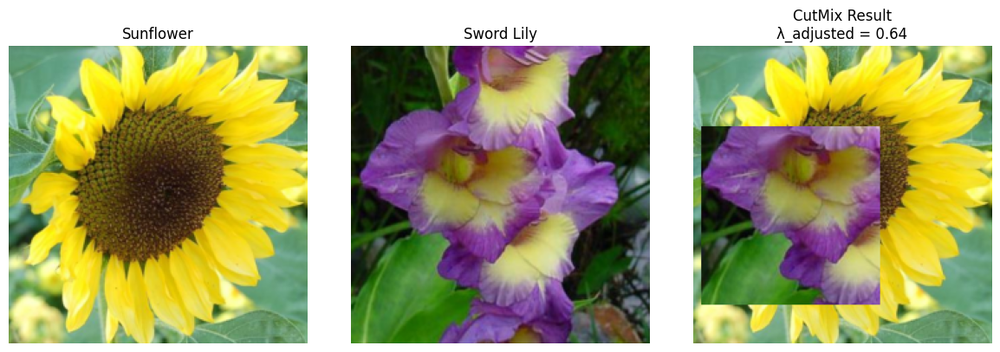

Mixed label composition:
  Sunflower weight: 0.642
  Sword Lily  weight: 0.358


In [40]:
import os
import random
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import scipy.io

# 1) Define Oxford102Dataset (as provided)
class Oxford102Dataset(Dataset):
    def __init__(self, images_dir, mat_path, transform=None):
        self.images_dir = images_dir
        self.transform = transform

        mat = scipy.io.loadmat(mat_path)
        labels = mat["labels"].reshape(-1)        # shape (8189,)
        self.labels = (labels - 1).astype(int)    # zero‐based [0..101]

        self.fnames = sorted(
            f for f in os.listdir(images_dir)
            if f.lower().endswith(".jpg")
        )
        assert len(self.fnames) == len(self.labels), "Image/label count mismatch"

    def __len__(self):
        return len(self.fnames)

    def __getitem__(self, idx):
        fn  = self.fnames[idx]
        img = Image.open(os.path.join(self.images_dir, fn)).convert("RGB")
        if self.transform:
            img = self.transform(img)
        lbl = self.labels[idx]
        return img, lbl, fn

# 2) Set up transforms and dataset
val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

dataset = Oxford102Dataset(
    images_dir=r"D:\Downloads\102flowers\jpg",
    mat_path   =r"D:\Downloads\imagelabels.mat",
    transform  = val_tfms
)

# 3) List of class names (must match the training order)
class_names = [
    'pink primrose', 'hard-leaved pocket orchid', 'canterbury bells', 'sweet pea',
    'english marigold', 'tiger lily', 'moon orchid', 'bird of paradise', 'monkshood',
    'globe thistle', 'snapdragon', "colt's foot", 'king protea', 'spear thistle',
    'yellow iris', 'globe-flower', 'purple coneflower', 'peruvian lily', 'balloon flower',
    'giant white arum lily', 'fire lily', 'pincushion flower', 'fritillary',
    'red ginger', 'grape hyacinth', 'corn poppy', 'prince of wales feathers',
    'stemless gentian', 'artichoke', 'sweet william', 'carnation', 'garden phlox',
    'love in the mist', 'mexican aster', 'alpine sea holly', 'ruby-lipped cattleya',
    'cape flower', 'great masterwort', 'siam tulip', 'lenten rose', 'barbeton daisy',
    'daffodil', 'sword lily', 'poinsettia', 'bolero deep blue', 'wallflower',
    'marigold', 'buttercup', 'oxeye daisy', 'common dandelion', 'petunia',
    'wild pansy', 'primula', 'sunflower', 'pelargonium', 'bishop of llandaff',
    'gaura', 'geranium', 'orange dahlia', 'pink-yellow dahlia?', 'cautleya spicata',
    'japanese anemone', 'black-eyed susan', 'silverbush', 'californian poppy',
    'osteospermum', 'spring crocus', 'bearded iris', 'windflower', 'tree poppy',
    'gazania', 'azalea', 'water lily', 'rose', 'thorn apple', 'morning glory',
    'passion flower', 'lotus', 'toad lily', 'anthurium', 'frangipani', 'clematis',
    'hibiscus', 'columbine', 'desert-rose', 'tree mallow', 'magnolia', 'cyclamen',
    'watercress', 'canna lily', 'hippeastrum', 'bee balm', 'ball moss',
    'foxglove', 'bougainvillea', 'camellia', 'mallow', 'mexican petunia',
    'bromelia', 'blanket flower', 'trumpet creeper', 'blackberry lily'
]

# 4) Identify the indices for "sunflower" and "tiger lily"
sunflower_idx = class_names.index("sunflower")     # index where label == sunflower
lily_idx      = class_names.index("sword lily")    # index where label == tiger lily

# 5) Gather all dataset indices for each class
sunflower_indices = [i for i, (_, lbl, _) in enumerate(dataset) if lbl == sunflower_idx]
lily_indices      = [i for i, (_, lbl, _) in enumerate(dataset) if lbl == lily_idx]

assert sunflower_indices, "No sunflower images found in the dataset."
assert lily_indices,      "No tiger lily images found in the dataset."

# 6) Randomly select one sample from each class
idx_sf = random.choice(sunflower_indices)
idx_l  = random.choice(lily_indices)

img_sf, lbl_sf, fn_sf = dataset[idx_sf]  # sunflower tensor
img_l,  lbl_l,  fn_l  = dataset[idx_l]   # tiger lily tensor

# 7) Perform CutMix between the two selected images
#    Using the “standard” CutMix bounding‐box approach
#    Reference: https://arxiv.org/abs/1905.04899

# Convert to CPU if on GPU, and ensure float
img_sf = img_sf.cpu().float()
img_l  = img_l.cpu().float()

# (a) Sample λ ∼ Beta(1, 1) → Uniform(0,1)
lam = np.random.beta(1.0, 1.0)

# (b) Determine image dimensions
_, H, W = img_sf.shape

# (c) Compute the cutout patch size (area = (1 - λ) * W * H)
cut_ratio = np.sqrt(1.0 - lam)
cut_w = int(W * cut_ratio)
cut_h = int(H * cut_ratio)

# (d) Select a random center point
cx = np.random.randint(W)
cy = np.random.randint(H)

# (e) Calculate the bounding box coordinates (clamped)
x1 = max(cx - cut_w // 2, 0)
y1 = max(cy - cut_h // 2, 0)
x2 = min(cx + cut_w // 2, W)
y2 = min(cy + cut_h // 2, H)

# (f) Create a copy of the sunflower image to blend into
mixed_img = img_sf.clone()

# (g) Replace the rectangle [y1:y2, x1:x2] in mixed_img with the same patch from img_l
mixed_img[:, y1:y2, x1:x2] = img_l[:, y1:y2, x1:x2]

# (h) Calculate the adjusted λ (actual area ratio)
area_sf = W * H - (x2 - x1) * (y2 - y1)
lam_adjusted = area_sf / (W * H)

# 8) Build mixed label (as a tuple for demonstration: (λ * one-hot_sf, (1−λ) * one-hot_l))
#    For most training loops: loss = lam_adjusted * L(pred, lbl_sf) + (1−lam_adjusted) * L(pred, lbl_l)
mixed_label = {
    "sunflower":    lam_adjusted,
    "tiger lily":   1.0 - lam_adjusted
}

# 9) Visualize the two original images and the CutMix result (unnormalize for display)
inv_normalize = transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
    std =[ 1.0 / 0.229,    1.0 / 0.224,    1.0 / 0.225]
)

def to_numpy(img_tensor):
    """Apply inverse normalization and convert a Tensor to H×W×C numpy array."""
    img_disp = inv_normalize(img_tensor)
    img_disp = torch.clamp(img_disp, 0.0, 1.0)
    return img_disp.permute(1, 2, 0).numpy()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
ax1.imshow(to_numpy(img_sf))
ax1.set_title(f"Sunflower")
ax1.axis("off")

ax2.imshow(to_numpy(img_l))
ax2.set_title(f"Sword Lily")
ax2.axis("off")

ax3.imshow(to_numpy(mixed_img))
ax3.set_title(f"CutMix Result\nλ_adjusted = {lam_adjusted:.2f}")
ax3.axis("off")

plt.tight_layout()
plt.show()

# 10) Print out the mixed‐label weights for clarity
print("Mixed label composition:")
print(f"  Sunflower weight: {mixed_label['sunflower']:.3f}")
print(f"  Sword Lily  weight: {mixed_label['tiger lily']:.3f}")
